# Asthma and Pollution Methodology
Ainsley Atherton, Nikki La, Jordan Ledbetter, Palaniappan Vijay Sithambaram


In [1]:
#Packages
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import geopandas as gpd

from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score

import warnings
warnings.filterwarnings('ignore')
#comment


## Datasets
- The CDC National Environmental Public Health Tracking Network is a collection of data
comprising of census data, the Behavioral Risk Factor Surveillance System (BRFSS), and other
epidemiological surveys. Querying asthma data by county and year for emergency room visits, hospitalizations, and prevalence. 
    - Emergency room data includes: StateFIPS, State, CountyFIPS, County, Year, Value
    - Hospitalizations data includes: StateFIPS, State, CountyFIPS, County, Year, Value
    - Prevalence data includes: StateFIPS, State, CountyFIPS, County, Year, Value, Data Comment, 95% Confidence Interval, Confidence Interval Low, Confidence Interval High
- Environmental Protection Agency (EPA) data is utilized for this project, specifically, annual Air Quality Index (AQI) data by county spanning the years 2000 to 2021. 
    - The CSV file encompasses the following variables: State, County, Year, Days with AQI, Good Days, Moderate Days, Unhealthy for Sensitive Groups Days, Unhealthy Days, Very Unhealthy Days, Hazardous Days, Max AQI, 90th Percentile AQI, Median AQI, Days CO, Days NO2, Days Ozone, Days PM2.5, Days PM10.


- Note: It's important to acknowledge that not all counties may report data; however, the analysis captures trends across urban and highly populated areas.

In [2]:
#Read in the data
#Asthma
folder_path = 'CDC_Asthma_Data'
asthma_prev = pd.read_csv(folder_path + '/Adult_Asthma_prev2018-2021/data_180748.csv')
asthma_hosp = pd.read_csv(folder_path + '/Asthma_Hospitalizations2000-2021/data_181454.csv')
asthma_er = pd.read_csv(folder_path + '/ER_visits_Asthma2000-2021/data_181211.csv')


In [3]:
#EPA Data 2000 - 2021
AQI_folder_path = 'CDC_Asthma_Data/AQI_data'
AQI2000 = pd.read_csv(AQI_folder_path + '/annual_aqi_by_county_2000.csv')
AQI2001 = pd.read_csv(AQI_folder_path + '/annual_aqi_by_county_2001.csv')
AQI2002 = pd.read_csv(AQI_folder_path + '/annual_aqi_by_county_2002.csv')
AQI2003 = pd.read_csv(AQI_folder_path + '/annual_aqi_by_county_2003.csv')
AQI2004 = pd.read_csv(AQI_folder_path + '/annual_aqi_by_county_2004.csv')
AQI2005 = pd.read_csv(AQI_folder_path + '/annual_aqi_by_county_2005.csv')
AQI2006 = pd.read_csv(AQI_folder_path + '/annual_aqi_by_county_2006.csv')
AQI2007 = pd.read_csv(AQI_folder_path + '/annual_aqi_by_county_2007.csv')
AQI2008 = pd.read_csv(AQI_folder_path + '/annual_aqi_by_county_2008.csv')
AQI2009 = pd.read_csv(AQI_folder_path + '/annual_aqi_by_county_2009.csv')
AQI2010 = pd.read_csv(AQI_folder_path + '/annual_aqi_by_county_2010.csv')
AQI2011 = pd.read_csv(AQI_folder_path + '/annual_aqi_by_county_2011.csv')
AQI2012 = pd.read_csv(AQI_folder_path + '/annual_aqi_by_county_2012.csv')
AQI2013 = pd.read_csv(AQI_folder_path + '/annual_aqi_by_county_2013.csv')
AQI2014 = pd.read_csv(AQI_folder_path + '/annual_aqi_by_county_2014.csv')
AQI2015 = pd.read_csv(AQI_folder_path + '/annual_aqi_by_county_2015.csv')
AQI2016 = pd.read_csv(AQI_folder_path + '/annual_aqi_by_county_2016.csv')
AQI2017 = pd.read_csv(AQI_folder_path + '/annual_aqi_by_county_2017.csv')
AQI2018 = pd.read_csv(AQI_folder_path + '/annual_aqi_by_county_2018.csv')
AQI2019 = pd.read_csv(AQI_folder_path + '/annual_aqi_by_county_2019.csv')
AQI2020 = pd.read_csv(AQI_folder_path + '/annual_aqi_by_county_2020.csv')
AQI2021 = pd.read_csv(AQI_folder_path + '/annual_aqi_by_county_2021.csv')

In [4]:
### Load shapefiles
# Counties
url_county = 'https://www2.census.gov/geo/tiger/GENZ2021/shp/cb_2021_us_county_500k.zip'
county_gdf = gpd.read_file(url_county)

# States
url_county = 'https://www2.census.gov/geo/tiger/GENZ2021/shp/cb_2021_us_state_500k.zip'
state_gdf = gpd.read_file(url_county)

# Exclude everthing outside the contiguous US
exclude_list = [15, 72, 2, 60, 66, 69, 78]
county_gdf = county_gdf.loc[~county_gdf['STATEFP'].astype(int).isin(exclude_list)]
state_gdf = state_gdf.loc[~state_gdf['STATEFP'].astype(int).isin(exclude_list)]

# Convert to 5070
county_gdf = county_gdf.to_crs(5070) 
state_gdf = state_gdf.to_crs(5070)

# Create a FIPS code
county_gdf['FIPS'] = county_gdf.STATEFP + county_gdf.COUNTYFP

## Data Pre-Processing

### Asthma Prevalence

In [5]:
asthma_prev.rename(columns = {'Value':'Prevalence %'}, inplace = True) 

#Remove null columns and unneded columns
asthma_prev = asthma_prev.drop(['Data Comment', 'Unnamed: 10', '95% Confidence Interval', 'Confidence Interval Low', 'Confidence Interval High'], axis=1)

## Merge asthma prevalence data with geospatial data
# Convert county FIPS code columns to strings
asthma_prev['CountyFIPS'] = asthma_prev['CountyFIPS'].astype(str)

# Add leading zeros to FIPS code where needed
asthma_prev['CountyFIPS'] = asthma_prev['CountyFIPS'].apply(lambda x: x.zfill(5))

# Groupy values by FIPS 
#grouped_hosp = asthma_hosp.groupby('CountyFIPS')['Hospitalizations (rate per 10,000)'].sum().reset_index()

prev18 = asthma_prev[asthma_prev['Year'] == 2018]
prev19 = asthma_prev[asthma_prev['Year'] == 2019]
prev20 = asthma_prev[asthma_prev['Year'] == 2020]
prev21 = asthma_prev[asthma_prev['Year'] == 2021]

# Merge the datasets on their FIPS code

merged_prev18 = county_gdf.merge(prev18, left_on='FIPS', right_on='CountyFIPS', how='left')
merged_prev19 = county_gdf.merge(prev19, left_on='FIPS', right_on='CountyFIPS', how='left')
merged_prev20 = county_gdf.merge(prev20, left_on='FIPS', right_on='CountyFIPS', how='left')
merged_prev21 = county_gdf.merge(prev21, left_on='FIPS', right_on='CountyFIPS', how='left')

### Hospitalizations due to Asthma
- Age adjusted rate of hospitalization for asthma per 10,000

In [8]:
# Rename Value column
asthma_hosp.rename(columns = {'Value':'Hospitalizations (rate per 10,000)'}, inplace = True) 

# Remove all-null columns
asthma_hosp = asthma_hosp.drop(columns = 'Unnamed: 7')

# Calculate percentage of suppressed data
is_suppressed = asthma_hosp[asthma_hosp['Hospitalizations (rate per 10,000)'] == 'Suppressed']
#print('Percentage of Suppressed Data:', (len(is_suppressed) / len(asthma_hosp)) * 100)

# Calculate percentage of unstability
is_unstable = asthma_hosp[asthma_hosp['Data Comment'] == 'Unstable']
#print('Percentage of Unstability:', (len(is_unstable) / len(asthma_hosp)) * 100)

# Asthma Hospitalizations: 2000-2021
asthma_hosp['Hospitalizations (rate per 10,000)'] = asthma_hosp['Hospitalizations (rate per 10,000)'].replace('Suppressed', np.nan) #convert 'Supressed' values to NaN
asthma_hosp['Hospitalizations (rate per 10,000)'] = pd.to_numeric(asthma_hosp['Hospitalizations (rate per 10,000)']) #convert value to numeric column

# Fix columns for successful merge
asthma_hosp = asthma_hosp.drop(columns='Data Comment')
asthma_hosp['CountyFIPS'] = asthma_hosp['CountyFIPS'].astype(int)

<Axes: title={'center': 'Total Hospitalizations for Asthma (rate per 10,000) by Year'}, xlabel='Year'>

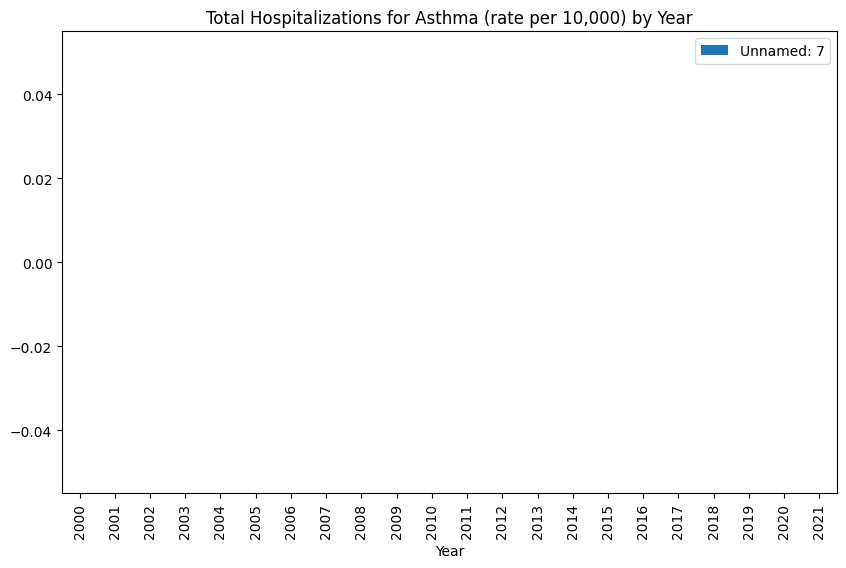

In [9]:


# BEGIN: group asthma_er dataset by year and sum the last column in new dataframe
asthma_hosp_grouped = asthma_er.groupby('Year').sum()
asthma_hosp_grouped = asthma_hosp_grouped.drop(columns = {'CountyFIPS', 'StateFIPS'})
asthma_hosp_grouped.plot(kind='bar', figsize=(10, 6), title='Total Hospitalizations for Asthma (rate per 10,000) by Year')


### ER visits due to Asthma

In [20]:
asthma_er.rename(columns = {'Value':'ER visits for Asthma (rate per 10,000)'}, inplace = True) 
#asthma_er.info()

asthma_er = asthma_er.drop(['Unnamed: 7', 'Data Comment'], axis=1)

# Calculate percentage of suppressed data
er_suppressed = asthma_er[asthma_er['ER visits for Asthma (rate per 10,000)'] == 'Suppressed']
#print('Percentage of Suppressed Data:', (len(er_suppressed) / len(asthma_er)) * 100)

# Asthma ER visits: 2000-2021
asthma_er['ER visits for Asthma (rate per 10,000)'] = asthma_er['ER visits for Asthma (rate per 10,000)'].replace('Suppressed', np.nan) #convert 'Supressed' values to NaN
asthma_er['ER visits for Asthma (rate per 10,000)'] = pd.to_numeric(asthma_er['ER visits for Asthma (rate per 10,000)']) #convert value to numeric column
#asthma_er['ER visits for Asthma (rate per 10,000)'].describe()

county_gdf.rename(columns = {'GEOID':'CountyFIPS'}, inplace = True) 

1.0838118280516098
[25560.37]
[[ 1.         -0.08381183]
 [-0.08381183  1.        ]]
SignificanceResult(statistic=-0.08706316780510202, pvalue=0.7396932533176978)


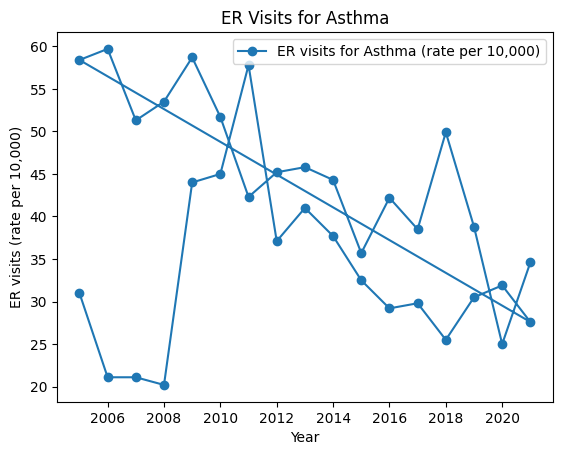

In [21]:
#K Means Clustering <-- if we can group counties together by similarity, we can make predictive models for each cluster
from sklearn.cluster import KMeans
import numpy as np
import scipy.spatial.distance as ssd 
import scipy.stats as ss

#Create a dataframe with the data we want to cluster
X = asthma_er[['County', 'Year', 'ER visits for Asthma (rate per 10,000)']].copy()
#print(X)
# Calculate the mean for each county
grouped_df = X.groupby('County')['ER visits for Asthma (rate per 10,000)'].mean()
#print(grouped_df)

import matplotlib.pyplot as plt

# Select the first two counties
counties = X['County'].unique()[:2]

# Filter the DataFrame for the selected counties
filtered_df = X[X['County'].isin(counties)]
c1 = filtered_df[filtered_df['County'] == counties[0]]
c1 = np.array(c1['ER visits for Asthma (rate per 10,000)'])
c2 = filtered_df[filtered_df['County'] == counties[1]]
c2 = np.array(c2['ER visits for Asthma (rate per 10,000)'])

print(ssd.correlation(c1, c2)) # Computes a distance measure based on correlation between the two vectors
print(np.correlate(c1, c2, mode='valid')) # Does a cross-correlation of same sized arrays and gives back correlation
print(np.corrcoef(c1, c2)) # Gives back the correlation matrix for the two arrays
print(ss.spearmanr(c1, c2)) # Gives the spearman correlation for the two arrays

# Plot the data
filtered_df.plot(x='Year', y='ER visits for Asthma (rate per 10,000)', marker='o')

# Set the plot title and labels
plt.title('ER Visits for Asthma')
plt.xlabel('Year')
plt.ylabel('ER visits (rate per 10,000)')

# Show the plot
plt.show()




In [22]:
#Get rid of data after 2018 as lots of missing data
asthma_er.isnull().sum()
asthma_er2018 = asthma_er[asthma_er['Year'] <= 2018]
asthma_er2018.isnull().sum()
asthma_er = asthma_er.dropna()
asthma_er.isnull().sum()


StateFIPS                                 0
State                                     0
CountyFIPS                                0
County                                    0
Year                                      0
ER visits for Asthma (rate per 10,000)    0
dtype: int64

In [23]:
maricopa_years = asthma_er[asthma_er['County'] == 'Maricopa']['Year'].sort_values().unique()
print(maricopa_years)


[2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018
 2019 2020 2021]


In [24]:
"""import matplotlib.pyplot as plt

# Group the data by County
grouped_data = asthma_er.groupby('County')

# Sort the counties based on the number of outliers
sorted_counties = sorted(grouped_data.groups.keys(), key=lambda county: len(grouped_data.get_group(county)), reverse=True)

# Create subplots with a maximum of ten boxplots per figure
num_figures = (len(sorted_counties) - 1) // 10 + 1
num_rows = min(len(sorted_counties), 10)
num_cols = (len(sorted_counties) - 1) // num_rows + 1

# Iterate over the counties and create boxplots
for i, county in enumerate(sorted_counties):
    if i % 10 == 0:
        fig, axes = plt.subplots(num_rows, num_cols, figsize=(12, 6))
        fig.suptitle('Boxplots of ER visits for Asthma by County (Sorted by Outliers)')
    
    ax = axes[i // num_cols, i % num_cols] if num_figures > 1 else axes
    ax.boxplot(grouped_data.get_group(county)['ER visits for Asthma (rate per 10,000)'].values)
    ax.set_xticklabels([county], rotation=90)
    ax.set_xlabel('County')
    ax.set_ylabel('ER visits for Asthma (rate per 10,000)')

# Remove empty subplots
if len(sorted_counties) % 10 != 0:
    for i in range(len(sorted_counties) % 10, 10):
        fig.delaxes(axes[i // num_cols, i % num_cols])

plt.show()"""


"import matplotlib.pyplot as plt\n\n# Group the data by County\ngrouped_data = asthma_er.groupby('County')\n\n# Sort the counties based on the number of outliers\nsorted_counties = sorted(grouped_data.groups.keys(), key=lambda county: len(grouped_data.get_group(county)), reverse=True)\n\n# Create subplots with a maximum of ten boxplots per figure\nnum_figures = (len(sorted_counties) - 1) // 10 + 1\nnum_rows = min(len(sorted_counties), 10)\nnum_cols = (len(sorted_counties) - 1) // num_rows + 1\n\n# Iterate over the counties and create boxplots\nfor i, county in enumerate(sorted_counties):\n    if i % 10 == 0:\n        fig, axes = plt.subplots(num_rows, num_cols, figsize=(12, 6))\n        fig.suptitle('Boxplots of ER visits for Asthma by County (Sorted by Outliers)')\n    \n    ax = axes[i // num_cols, i % num_cols] if num_figures > 1 else axes\n    ax.boxplot(grouped_data.get_group(county)['ER visits for Asthma (rate per 10,000)'].values)\n    ax.set_xticklabels([county], rotation=90)\n

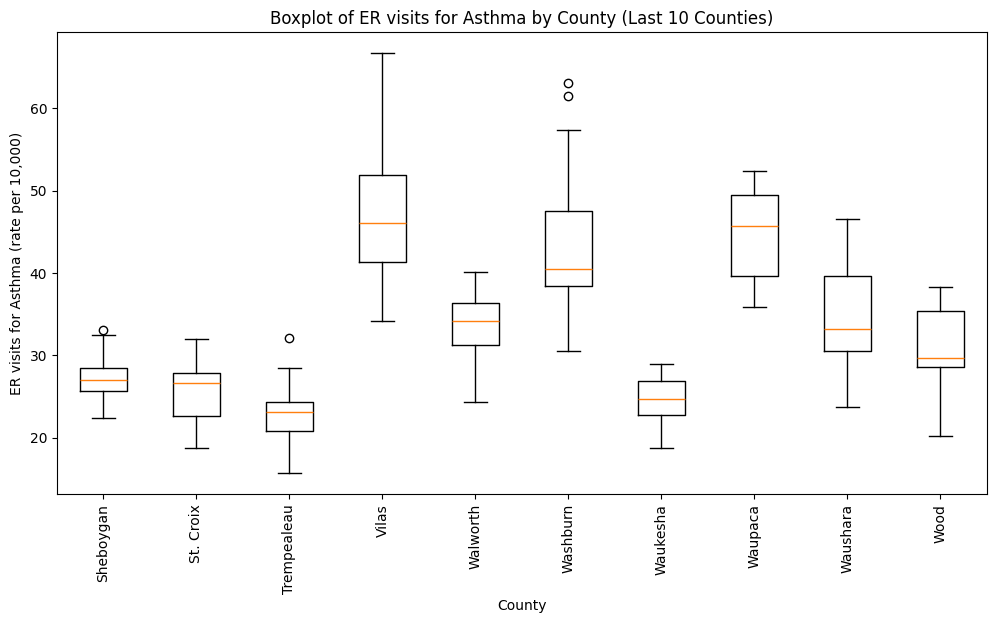

In [25]:
import matplotlib.pyplot as plt

# Filter the data for the last 10 counties
last_10_counties = asthma_er2018['County'].unique()[-10:]
filtered_data = [asthma_er2018[asthma_er2018['County'] == county]['ER visits for Asthma (rate per 10,000)'].values for county in last_10_counties]

# Create a boxplot for each county in the filtered data
plt.figure(figsize=(12, 6))
plt.boxplot(filtered_data, labels=last_10_counties)
plt.xlabel('County')
plt.ylabel('ER visits for Asthma (rate per 10,000)')
plt.title('Boxplot of ER visits for Asthma by County (Last 10 Counties)')
plt.xticks(rotation=90)
plt.show()

In [26]:
aer = asthma_er[asthma_er['Year'] == 2005]
#print(aer.shape)
asthma_er19 = asthma_er[asthma_er['Year'] <= 2019]
asthma_er19 = asthma_er19[asthma_er19['Year'] >= 2005]
#print(asthma_er19.head())
asthma_er19.shape

unique_counties_df = asthma_er19.groupby(['State', 'County']).size().reset_index(name='Counts')
print(f"before 14 ", {unique_counties_df.shape})

unique_counties_df = unique_counties_df[unique_counties_df['Counts'] == 15]
print(unique_counties_df.shape)
print(unique_counties_df.head(50))

states = unique_counties_df['State'].unique()
states

before 14  {(1459, 3)}
(725, 3)
         State          County  Counts
0      Arizona          Apache      15
1      Arizona         Cochise      15
2      Arizona        Coconino      15
3      Arizona            Gila      15
4      Arizona          Graham      15
5      Arizona        Greenlee      15
6      Arizona          La Paz      15
7      Arizona        Maricopa      15
8      Arizona          Mohave      15
9      Arizona          Navajo      15
10     Arizona            Pima      15
11     Arizona           Pinal      15
12     Arizona      Santa Cruz      15
13     Arizona         Yavapai      15
14     Arizona            Yuma      15
15  California         Alameda      15
17  California          Amador      15
18  California           Butte      15
19  California       Calaveras      15
20  California          Colusa      15
21  California    Contra Costa      15
22  California       Del Norte      15
23  California       El Dorado      15
24  California          Fresno  

array(['Arizona', 'California', 'Connecticut', 'Florida', 'Iowa', 'Maine',
       'Massachusetts', 'Minnesota', 'Missouri', 'New Jersey', 'New York',
       'Rhode Island', 'Tennessee', 'Utah', 'Vermont', 'Wisconsin'],
      dtype=object)

In [27]:
unique_counties_df

,State,County,Counts
0,Arizona,Apache,15
1,Arizona,Cochise,15
2,Arizona,Coconino,15
3,Arizona,Gila,15
4,Arizona,Graham,15
...,...,...,...
1454,Wisconsin,Waukesha,15
1455,Wisconsin,Waupaca,15
1456,Wisconsin,Waushara,15
1457,Wisconsin,Winnebago,15


In [28]:
#

#unique_counties = asthma_er['County'].unique() #<-- this one works but lumps same name counties together
#print(unique_counties.shape)
#unique_counties = asthma_er['CountyFIPS'].unique()
#print(unique_counties.head())
# Create a new dataframe with unique counties based on state
"""

unique_counties_df = asthma_er.groupby(['State', 'County']).size().reset_index(name='Counts')

unique_counties_df = unique_counties_df[unique_counties_df['Counts'] == 10]


# Display the new dataframe
print(unique_counties_df.head(20))
print(unique_counties_df.shape)

unique_counties = unique_counties_df['County']
print(unique_counties.shape)"""

"\n\nunique_counties_df = asthma_er.groupby(['State', 'County']).size().reset_index(name='Counts')\n\nunique_counties_df = unique_counties_df[unique_counties_df['Counts'] == 10]\n\n\n# Display the new dataframe\nprint(unique_counties_df.head(20))\nprint(unique_counties_df.shape)\n\nunique_counties = unique_counties_df['County']\nprint(unique_counties.shape)"

In [29]:


for county in unique_counties_df['County']:
    #state = asthma_er[asthma_er['County'] == county]['State'].values[0]
    state = unique_counties_df[unique_counties_df['County'] == county]['State'].values[0]
    #state = unique_counties_df[unique_counties_df['County'] == county]['State']
    #state = asthma_er[asthma_er['CountyFIPS'] == county]['State'].values[0]
    print(f"County: {county}, State: {state}")

    #c1a = asthma_er[asthma_er['County'] == 'Maricopa']
    c1a = asthma_er19[asthma_er19["County"] == 'Maricopa']
    c1 = np.array(c1a['ER visits for Asthma (rate per 10,000)'])
    #print("This is c1:", c1)
    #c2a = asthma_er[asthma_er['County'] == county]
    #c2a = asthma_er[asthma_er['State'] == state]
    #c2a = asthma_er19[asthma_er19["County"] == county]
    c2a = asthma_er19[asthma_er19["County"] == county]
    c2a = asthma_er19[asthma_er19['State'] == state]
    c2a = c2a[c2a['County'] == county]
    c2 = np.array(c2a['ER visits for Asthma (rate per 10,000)'])
    #print("this is c2:", c2)
    #print(c2a)
    #print(c2a.shape)

    ssd.correlation(c1, c2) # Computes a distance measure based on correlation between the two vectors
    ccor = np.correlate(c1, c2, mode='valid') # Does a cross-correlation of same sized arrays and gives back correlation
    mcor = np.corrcoef(c1, c2) # Gives back the correlation matrix for the two arrays
    spear = ss.spearmanr(c1, c2) # Gives the spearman correlation for the two arrays
    pearson = ss.pearsonr(c1, c2)
    print(f"{county} Correlation: {ssd.correlation(c1, c2)}, spearman correlation: {spear}, pearson correlation: {pearson}")
    # Plot the data
    #df = [asthma_er[asthma_er['County'] == 'Maricopa'], asthma_er[asthma_er['County'] == county]]
    #df = pd.concat(df)
    #df = c1a.append(c2a, ignore_index=True)
    #df.plot(x='Year', y='ER visits for Asthma (rate per 10,000)', marker='o')
    #plt.plot(c1a, c2a, marker='o')
    """ax = c1a.plot(x='Year', y='ER visits for Asthma (rate per 10,000)', marker='o')
    c2a.plot(x='Year', y='ER visits for Asthma (rate per 10,000)', marker='o', ax=ax)"""

    """# Set the plot title and labels
    plt.title('ER Visits for Asthma ' + county)
    plt.xlabel('Year')
    plt.ylabel('ER visits (rate per 10,000)')

    # Show the plot
    plt.show()"""
    """
    if ssd.correlation(c1, c2) > 0.5:
        print(f"County: {county}, State: {state}, Correlation: {ssd.correlation(c1, c2)}")"""

County: Apache, State: Arizona
Apache Correlation: 0.5524501212772779, spearman correlation: SignificanceResult(statistic=0.5165328246658887, pvalue=0.04867865817127727), pearson correlation: PearsonRResult(statistic=0.44754987872272195, pvalue=0.09436448837164728)
County: Cochise, State: Arizona
Cochise Correlation: 1.5773084661288617, spearman correlation: SignificanceResult(statistic=-0.5821428571428571, pvalue=0.022793687126414258), pearson correlation: PearsonRResult(statistic=-0.5773084661288616, pvalue=0.024227738774272204)
County: Coconino, State: Arizona
Coconino Correlation: 1.1925644196050318, spearman correlation: SignificanceResult(statistic=-0.22698847312307222, pvalue=0.4158987105756837), pearson correlation: PearsonRResult(statistic=-0.1925644196050316, pvalue=0.4917195570457303)
County: Gila, State: Arizona
Gila Correlation: 0.7876616893436181, spearman correlation: SignificanceResult(statistic=0.17857142857142855, pvalue=0.5242843600465525), pearson correlation: Pears

In [30]:
from sklearn.linear_model import LinearRegression

# Perform linear regression for each county
for county in unique_counties_df['County']:
    x = asthma_er19['Year']
    x = x.values.reshape(-1, 1)
    y = asthma_er19['ER visits for Asthma (rate per 10,000)']
    
    model = LinearRegression()
    model.fit(x, y)
    model = LinearRegression().fit(x, y)

    plt
    
    # Print the results
    r_sq = model.score(x, y)
    asthma_er19.append({'Slope': model.coef_, 'Intercept': model.intercept_, 'r_sq': r_sq}, ignore_index=True)
    #print(f"coefficient of determination: {r_sq}")

asthma_er19
    


AttributeError: 'DataFrame' object has no attribute 'append'

### ER Grouping

In [ ]:
"""import scipy
plt.style.use("seaborn-whitegrid")
plt.rc(
    "figure",
    autolayout=True,
    figsize=(11, 4),
    titlesize=18,
    titleweight='bold',
)
plt.rc(
    "axes",
    labelweight="bold",
    labelsize="large",
    titleweight="bold",
    titlesize=16,
    titlepad=10,
)
%config InlineBackend.figure_format = 'retina'

ER_IncA = []
ER_DecB = []
ER_neutralC = []"""

"""
for county in unique_counties_df['County']:  #[:30]


    state = unique_counties_df[unique_counties_df['County'] == county]['State'].values[0]
    x = asthma_er19[asthma_er19['County'] == county]['Year']
    y = asthma_er19[asthma_er19['County'] == county]['ER visits for Asthma (rate per 10,000)']

    
    #All plots
    fig, ax = plt.subplots()
    ax.plot(x, y, label=county)
    p = sns.regplot(x='Year', y='ER visits for Asthma (rate per 10,000)', data=asthma_er19[asthma_er19['County'] == county], ci=None, scatter_kws=dict(color='0.25'))
    slope, intercept, r, p, sterr = scipy.stats.linregress(x=p.get_lines()[0].get_xdata(),
                                                       y=p.get_lines()[0].get_ydata())
    ax.set_title(f'ER Visits for Asthma {state}, {county}    Slope: {slope:.2f}')
    plt.show()
    print(f"County: {county}, Slope: {slope}, Intercept: {intercept}, R: {r}, P: {p}, StErr: {sterr}")
    #df.append(x)
    #df.append(y)

    #Just stats
    #p = sns.regplot(x='Year', y='ER visits for Asthma (rate per 10,000)', data=asthma_er19[asthma_er19['County'] == county], ci=None, scatter_kws=dict(color='0.25'))
    #slope, intercept, r, p, sterr = scipy.stats.linregress(x=p.get_lines()[0].get_xdata(),
    #                                                   y=p.get_lines()[0].get_ydata())

    if slope > 0:
        ER_IncA.append([county, slope])"""
        

## ER Group A

In [ ]:
import scipy
plt.style.use("seaborn-whitegrid")
plt.rc(
    "figure",
    autolayout=True,
    figsize=(11, 4),
    titlesize=18,
    titleweight='bold',
)
plt.rc(
    "axes",
    labelweight="bold",
    labelsize="large",
    titleweight="bold",
    titlesize=16,
    titlepad=10,
)
%config InlineBackend.figure_format = 'retina'

ER_IncA = []
ER_DecB = []
ER_neutralC = []

for county in unique_counties_df['County']:  #[:30]


    state = unique_counties_df[unique_counties_df['County'] == county]['State'].values[0]
    x = asthma_er19[asthma_er19['County'] == county]['Year']
    y = asthma_er19[asthma_er19['County'] == county]['ER visits for Asthma (rate per 10,000)']

    slope, intercept, r, p, sterr = scipy.stats.linregress(x, y)

    """
    #All plots
    fig, ax = plt.subplots()
    ax.plot(x, y, label=county)
    p = sns.regplot(x='Year', y='ER visits for Asthma (rate per 10,000)', data=asthma_er19[asthma_er19['County'] == county], ci=None, scatter_kws=dict(color='0.25'))
    slope, intercept, r, p, sterr = scipy.stats.linregress(x=p.get_lines()[0].get_xdata(),
                                                       y=p.get_lines()[0].get_ydata())
    ax.set_title(f'ER Visits for Asthma {state}, {county}    Slope: {slope:.2f}')
    plt.show()
    print(f"County: {county}, Slope: {slope}, Intercept: {intercept}, R: {r}, P: {p}, StErr: {sterr}")
    #df.append(x)
    #df.append(y)

    #Just stats
    #p = sns.regplot(x='Year', y='ER visits for Asthma (rate per 10,000)', data=asthma_er19[asthma_er19['County'] == county], ci=None, scatter_kws=dict(color='0.25'))
    #slope, intercept, r, p, sterr = scipy.stats.linregress(x=p.get_lines()[0].get_xdata(),
    #                                                   y=p.get_lines()[0].get_ydata())"""

    if slope > 0.1:
        ER_IncA.append([county, slope])

    if slope < -0.1:
        ER_DecB.append([county, slope])

    if slope < 0.1 and slope > -0.1:
        ER_neutralC.append([county, slope])

In [31]:
ER_IncA = pd.DataFrame(ER_IncA)
ER_IncA_full = ER_IncA.merge(asthma_er19, left_on=0, right_on='County')
ER_IncA_full = ER_IncA_full.rename(columns={0: 'cname', 1: 'slope'})
print(ER_IncA_full.shape)
print(ER_IncA_full.head(10))

ER_DecB = pd.DataFrame(ER_DecB)
ER_DecB_full = ER_DecB.merge(asthma_er19, left_on=0, right_on='County')
ER_DecB_full = ER_DecB_full.rename(columns={0: 'cname', 1: 'slope'})
print(ER_DecB_full.shape)
print(ER_DecB_full.head(10))

ER_neutralC = pd.DataFrame(ER_neutralC)
ER_neutralC_full = ER_neutralC.merge(asthma_er19, left_on=0, right_on='County')
ER_neutralC_full = ER_neutralC_full.rename(columns={0: 'cname', 1: 'slope'})
print(ER_neutralC_full.shape)
ER_neutralC_full.head(10)

NameError: name 'ER_IncA' is not defined

<Axes: title={'center': 'Total ER visits for Asthma (rate per 10,000) by Year'}, xlabel='Year'>

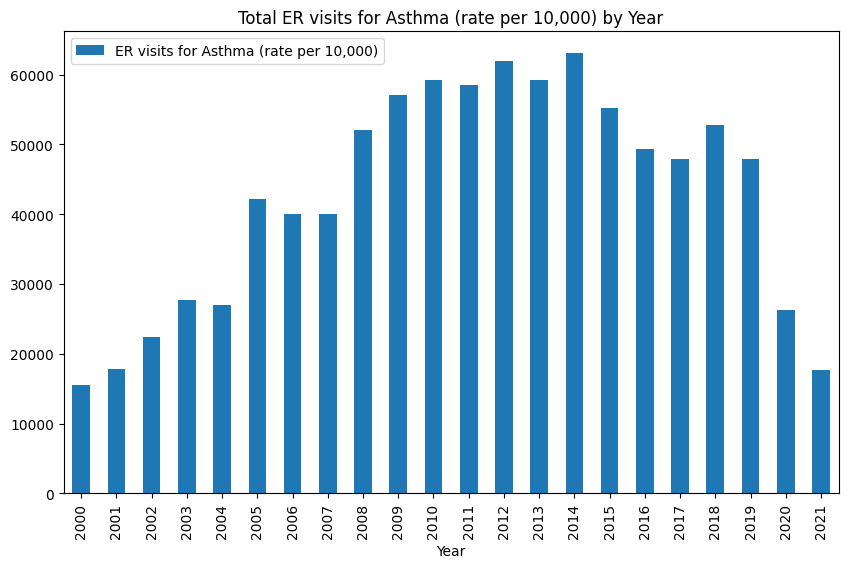

In [32]:
## Editing years
asthma_er

# BEGIN: group asthma_er dataset by year and sum the last column in new dataframe
asthma_er_grouped = asthma_er.groupby('Year').sum()
asthma_er_grouped = asthma_er_grouped.drop(columns = {'CountyFIPS', 'StateFIPS'})
asthma_er_grouped.plot(kind='bar', figsize=(10, 6), title='Total ER visits for Asthma (rate per 10,000) by Year')


In [33]:
asthma_er_xy = asthma_er[["Year", "ER visits for Asthma (rate per 10,000)"]]
asthma_er_xy

,Year,"ER visits for Asthma (rate per 10,000)"
0,2005,31.0
1,2006,21.1
2,2007,21.1
3,2008,20.2
4,2009,44.0
...,...,...
22054,2017,35.4
22055,2018,28.8
22056,2019,28.0
22057,2020,16.3


In [34]:
from sklearn.preprocessing import MinMaxScaler

# Create a MinMaxScaler object
scaler = MinMaxScaler()

for county in asthma_er['County'].unique():
    county_data = asthma_er[asthma_er['County'] == county]
    #print(county_data)
    normalized_data = scaler.fit_transform(county_data[['ER visits for Asthma (rate per 10,000)']])
    normalized_data = pd.DataFrame(normalized_data, columns=['ER visits for Asthma (rate per 10,000)'])
    normalized_data[['County', 'Year']] = county_data[['County', 'Year']]
    #normalized_data.plot(x='Year', y='ER visits for Asthma (rate per 10,000)', kind='line', title=county)




## Asthma Data Highlights

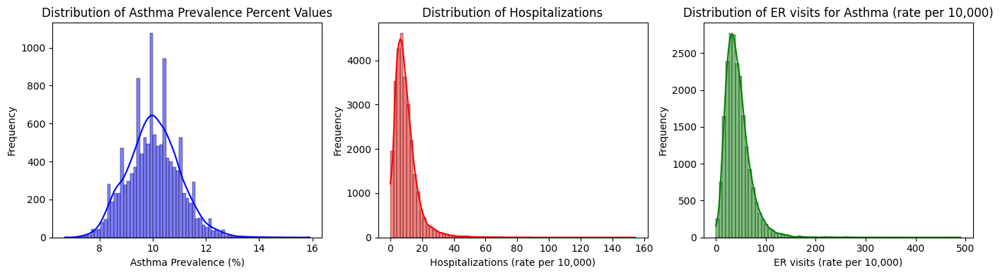

In [35]:
# Create a figure and three subplots
fig, axs = plt.subplots(1, 3, figsize=(14, 4))

# Plot the histograms
sns.histplot(ax=axs[0], data=asthma_prev, x='Prevalence %', bins=75, kde=True, color='blue', alpha=0.5)
axs[0].set_title('Distribution of Asthma Prevalence Percent Values')
axs[0].set_xlabel('Asthma Prevalence (%)')
axs[0].set_ylabel('Frequency')

sns.histplot(ax=axs[1], data=asthma_hosp, x='Hospitalizations (rate per 10,000)', bins=75, kde=True, color='red')
axs[1].set_title('Distribution of Hospitalizations')
axs[1].set_xlabel('Hospitalizations (rate per 10,000)')
axs[1].set_ylabel('Frequency')

sns.histplot(ax=axs[2], data=asthma_er, x='ER visits for Asthma (rate per 10,000)', bins=75, kde=True, color='green')
axs[2].set_title('Distribution of ER visits for Asthma (rate per 10,000)')
axs[2].set_xlabel('ER visits (rate per 10,000)')
axs[2].set_ylabel('Frequency')

# Adjust the spacing between subplots
plt.tight_layout()

# Show the figure
plt.show()



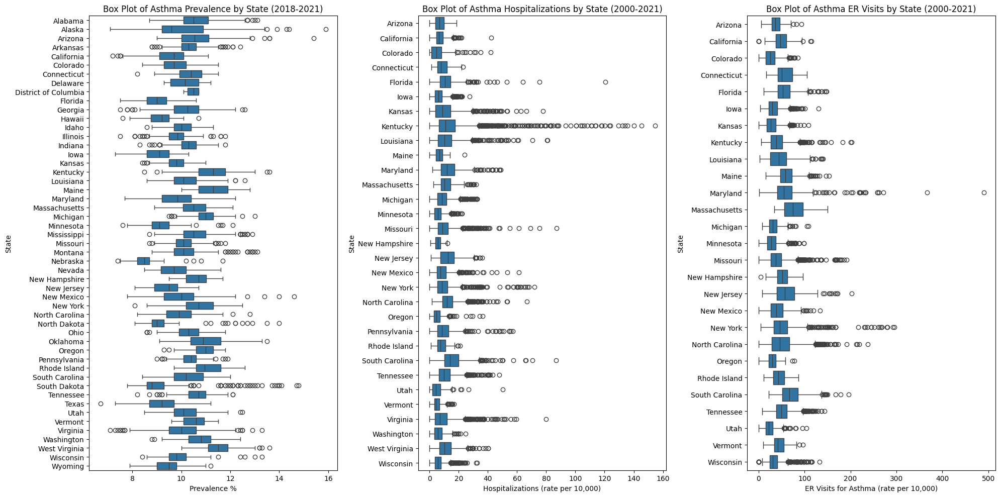

In [36]:
# Box Plot of Asthma ER Visits by State
fig, axs = plt.subplots(1, 3, figsize=(20, 10))

sns.boxplot(ax=axs[0], data=asthma_prev[(asthma_prev['Year'] >= 2018) & (asthma_prev['Year'] <= 2021)],
            x='Prevalence %', y='State', orient='h')
axs[0].set_title('Box Plot of Asthma Prevalence by State (2018-2021)')
axs[0].set_xlabel('Prevalence %')
axs[0].set_ylabel('State')

sns.boxplot(ax=axs[1], data=asthma_hosp[(asthma_hosp['Year'] >= 2000) & (asthma_hosp['Year'] <= 2021)],
            x='Hospitalizations (rate per 10,000)', y='State', orient='h')
axs[1].set_title('Box Plot of Asthma Hospitalizations by State (2000-2021)')
axs[1].set_xlabel('Hospitalizations (rate per 10,000)')
axs[1].set_ylabel('State')

sns.boxplot(ax=axs[2], data=asthma_er[(asthma_er['Year'] >= 2000) & (asthma_er['Year'] <= 2021)],
            x='ER visits for Asthma (rate per 10,000)', y='State', orient='h')
axs[2].set_title('Box Plot of Asthma ER Visits by State (2000-2021)')
axs[2].set_xlabel('ER Visits for Asthma (rate per 10,000)')
axs[2].set_ylabel('State')

plt.tight_layout()
plt.show()
#axs[0].set_xticklabels(axs[0].get_xticklabels(), rotation=45)



### Air Quality

In [37]:
# Merge AQI data from 2000 - 2019
all_aqi_data = pd.concat([AQI2000, AQI2001, AQI2002, AQI2003, AQI2004, AQI2005, AQI2006, AQI2007, AQI2008, AQI2009, AQI2010,
                          AQI2011, AQI2012, AQI2013, AQI2014, AQI2015, AQI2016, AQI2017, AQI2018, AQI2019, AQI2020, AQI2021], ignore_index=True)

In [38]:
# Find NaN values
nan_values = all_aqi_data.isna().sum()
#print(nan_values) # 0 NaN values
#print(all_aqi_data.shape)

all_aqi_data
all_aqi_data = all_aqi_data.sort_values(by = ['County', 'Year'], ascending = True)
#all_aqi_data

#columns_to_keep = ['State','FIPS', 'County', 'geometry']
columns_to_keep = ['STATE_NAME', "FIPS", 'NAME', 'geometry']
gdf_extra = county_gdf[columns_to_keep]

gdf_extra.rename(columns = {'STATE_NAME':'State', 'NAME':'County'}, inplace = True)

#merging with geospatial data
all_aqi_data = all_aqi_data.merge(gdf_extra, left_on = ['State', 'County'], right_on = ['State', 'County'], how = 'left')
#all_aqi_data.head(3)

In [39]:
geo_aqi_list = []

# Loop through years from 2000 to 2019
for year in range(2000, 2022):
    # Create a mask for the current year
    year_mask = (all_aqi_data['Year'] == year)
    
    # Filter data for the current year
    aqi_year = all_aqi_data[year_mask]
    
    # Merge AQI data with the county
    geo_aqi_year = county_gdf.merge(aqi_year)
    
    geo_aqi_list.append(geo_aqi_year)

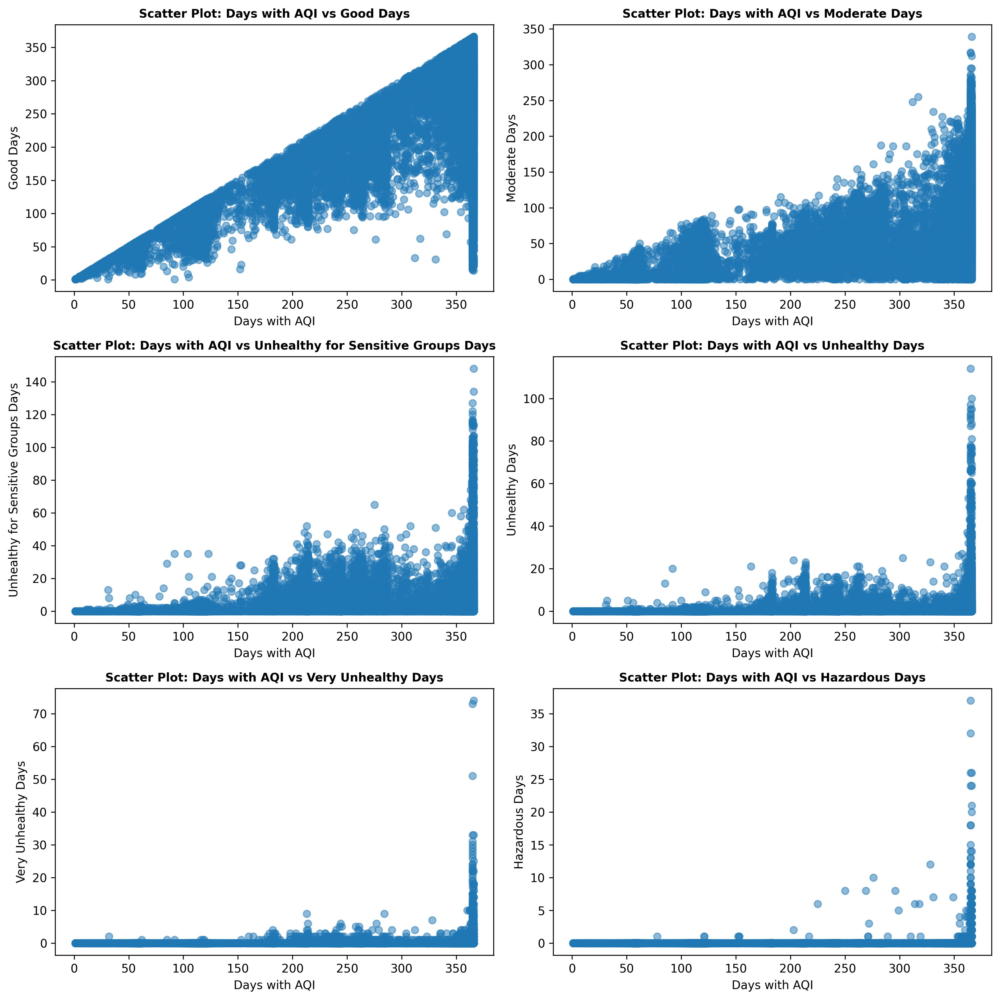

In [40]:
categories = ['Good Days', 'Moderate Days', 'Unhealthy for Sensitive Groups Days', 'Unhealthy Days', 'Very Unhealthy Days', 'Hazardous Days']

fig, axes = plt.subplots(3, 2, figsize=(12, 12), dpi=300)

for i, category in enumerate(categories):
    row, col = divmod(i, 2)
    axes[row, col].scatter(all_aqi_data['Days with AQI'], all_aqi_data[category], alpha=0.5)
    axes[row, col].set_title(f'Scatter Plot: Days with AQI vs {category}', fontsize=10, fontweight='bold')
    axes[row, col].set_xlabel('Days with AQI')
    axes[row, col].set_ylabel(category)

plt.tight_layout()
plt.show()

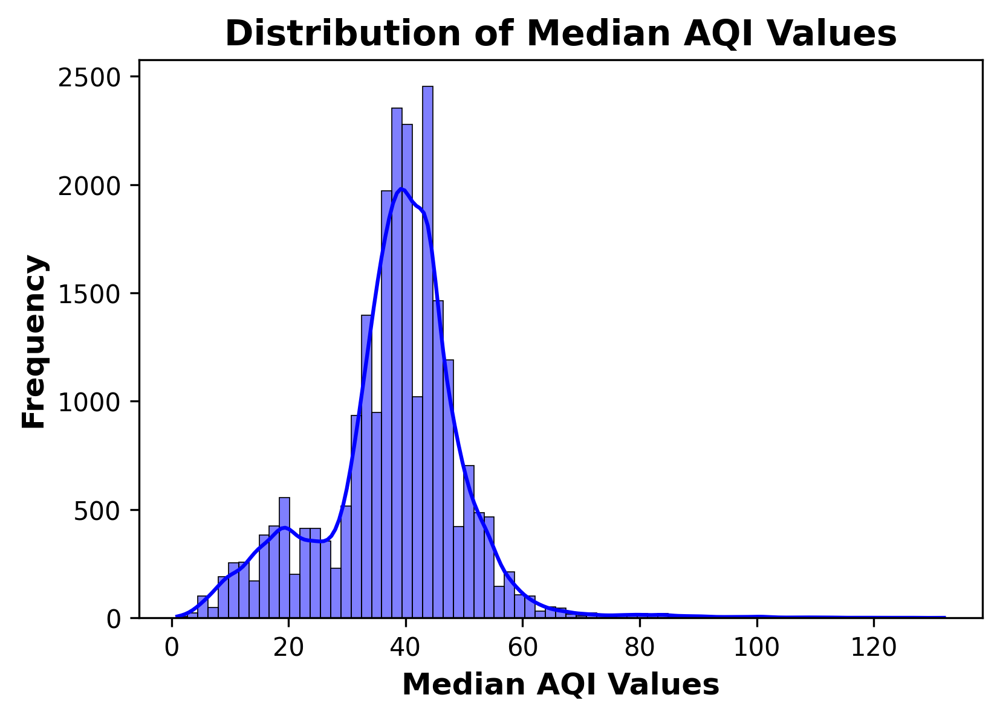

In [41]:
plt.figure(figsize=(6, 4), dpi=300)
sns.histplot(data=all_aqi_data, x='Median AQI', bins=75, kde=True, color='blue')
plt.title('Distribution of Median AQI Values', fontsize=14, fontweight='bold')
plt.xlabel('Median AQI Values', fontsize=12, fontweight='bold')
plt.ylabel('Frequency', fontsize=12, fontweight='bold')
plt.show()

## Asthma Prevalence and Air Quality

In [42]:
aqi_prev = pd.merge(all_aqi_data, asthma_prev, on = ['State', 'County', 'Year'], how = 'left')

In [43]:
aqi_prev18 = aqi_prev[aqi_prev['Year'] == 2018]
geo_aqiprev18 = county_gdf.merge(aqi_prev18)

aqi_prev19 = aqi_prev[aqi_prev['Year'] == 2019]
geo_aqiprev19 = county_gdf.merge(aqi_prev19)

aqi_prev20 = aqi_prev[aqi_prev['Year'] == 2020]
geo_aqiprev20 = county_gdf.merge(aqi_prev20)

aqi_prev21 = aqi_prev[aqi_prev['Year'] == 2021]
geo_aqiprev21 = county_gdf.merge(aqi_prev21)

In [44]:
#aqi_prev18.plot(column = 'Daily Mean PM2.5 Concentration', cmap = 'viridis', legend = True)
#state_gdf.plot()
"""
fig, axes = plt.subplots(4, 2, figsize=(15, 15), dpi=300)

axes = axes.flatten()

# 2018
geo_aqiprev18.plot(column='Days PM2.5', ax = axes[0], legend=True,
                 missing_kwds={'color': 'darkgrey'},
                 cmap='Blues') #edgecolor='black', linewidth=0.2)
state_gdf.plot(ax=axes[0], facecolor='none', edgecolor='black', linewidth=0.7)
# 2019
geo_aqiprev19.plot(column='Days PM2.5', ax = axes[2], legend=True,
                 missing_kwds={'color': 'darkgrey'},
                 cmap='Blues') #edgecolor='black', linewidth=0.2)
state_gdf.plot(ax=axes[2], facecolor='none', edgecolor='black', linewidth=0.7)
# 2020
geo_aqiprev20.plot(column='Days PM2.5', ax = axes[4], legend=True,
                 missing_kwds={'color': 'darkgrey'},
                 cmap='Blues') #edgecolor='black', linewidth=0.2)
state_gdf.plot(ax=axes[4], facecolor='none', edgecolor='black', linewidth=0.7)
# 2021
geo_aqiprev21.plot(column='Days PM2.5', ax = axes[6], legend=True,
                 missing_kwds={'color': 'darkgrey'},
                 cmap='Blues') #edgecolor='black', linewidth=0.2)
state_gdf.plot(ax=axes[6], facecolor='none', edgecolor='black', linewidth=0.7)

# 2018
merged_prev18.plot(column='Prevalence %', ax = axes[1], legend=True,
                 missing_kwds={'color': 'darkgrey'},
                 cmap='Blues', edgecolor='black', linewidth=0.2)
state_gdf.plot(ax=axes[1], facecolor='none', edgecolor='black', linewidth=0.7)
# 2019
merged_prev19.plot(column='Prevalence %', ax=axes[3], legend=True,
                 missing_kwds={'color': 'darkgrey'},
                 cmap='Blues', edgecolor='black', linewidth=0.2)
state_gdf.plot(ax=axes[3], facecolor='none', edgecolor='black', linewidth=0.7)
# 2020
merged_prev20.plot(column='Prevalence %', ax=axes[5], legend=True,
                 missing_kwds={'color': 'darkgrey'},
                 cmap='Blues', edgecolor='black', linewidth=0.2)
state_gdf.plot(ax=axes[5], facecolor='none', edgecolor='black', linewidth=0.7)
# 2021
merged_prev21.plot(column='Prevalence %', ax=axes[7], legend=True,
                 missing_kwds={'color': 'darkgrey'},
                 cmap='Blues', edgecolor='black', linewidth=0.2)
state_gdf.plot(ax=axes[7], facecolor='none', edgecolor='black', linewidth=0.7)

axs = [0,1,2,3,4,5,6,7]
for i in axs:
    axes[i].set_axis_off()

axes[0].set_title('PM2.5 2018', fontsize=14, fontweight='bold')
axes[1].set_title('Asthma Prevalence 2018', fontsize=14, fontweight='bold')
axes[2].set_title('PM2.5 2019', fontsize=14, fontweight='bold')
axes[3].set_title('Asthma Prevalence 2019', fontsize=14, fontweight='bold')
axes[4].set_title('PM2.5 2020', fontsize=14, fontweight='bold')
axes[5].set_title('Asthma Prevalence 2020', fontsize=14, fontweight='bold')
axes[6].set_title('PM2.5 2021', fontsize=14, fontweight='bold')
axes[7].set_title('Asthma Prevalence 2021', fontsize=14, fontweight='bold')

plt.show()"""

"\nfig, axes = plt.subplots(4, 2, figsize=(15, 15), dpi=300)\n\naxes = axes.flatten()\n\n# 2018\ngeo_aqiprev18.plot(column='Days PM2.5', ax = axes[0], legend=True,\n                 missing_kwds={'color': 'darkgrey'},\n                 cmap='Blues') #edgecolor='black', linewidth=0.2)\nstate_gdf.plot(ax=axes[0], facecolor='none', edgecolor='black', linewidth=0.7)\n# 2019\ngeo_aqiprev19.plot(column='Days PM2.5', ax = axes[2], legend=True,\n                 missing_kwds={'color': 'darkgrey'},\n                 cmap='Blues') #edgecolor='black', linewidth=0.2)\nstate_gdf.plot(ax=axes[2], facecolor='none', edgecolor='black', linewidth=0.7)\n# 2020\ngeo_aqiprev20.plot(column='Days PM2.5', ax = axes[4], legend=True,\n                 missing_kwds={'color': 'darkgrey'},\n                 cmap='Blues') #edgecolor='black', linewidth=0.2)\nstate_gdf.plot(ax=axes[4], facecolor='none', edgecolor='black', linewidth=0.7)\n# 2021\ngeo_aqiprev21.plot(column='Days PM2.5', ax = axes[6], legend=True,\n    

<Axes: >

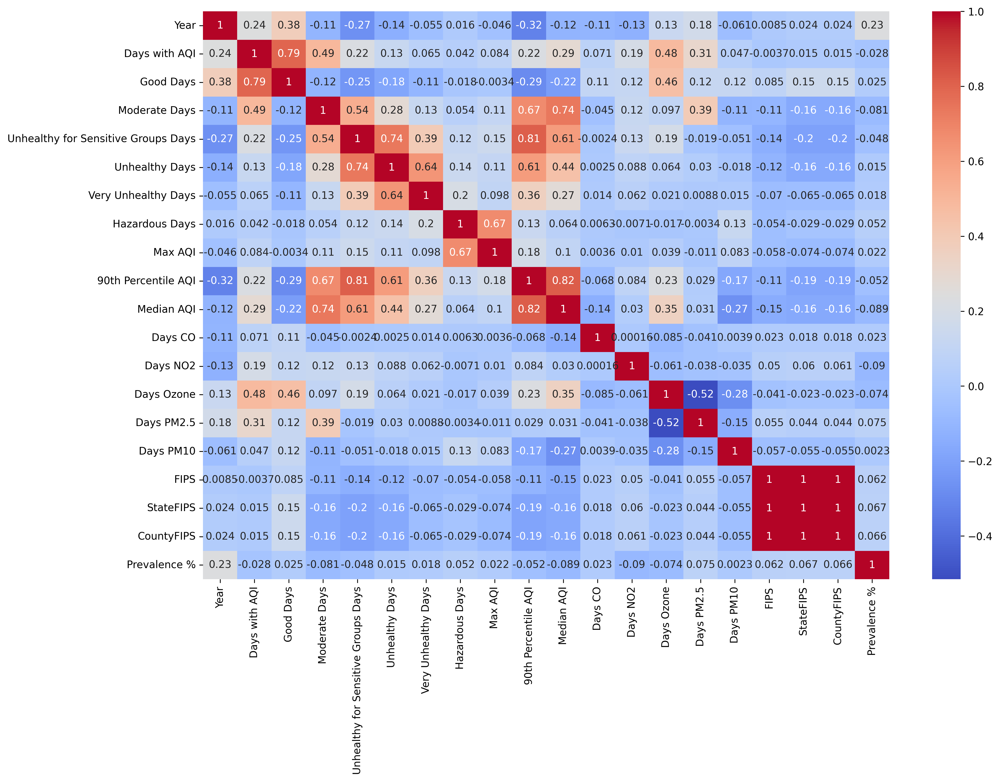

In [45]:
aqi_prev_adjusted = aqi_prev.drop(columns=['geometry', 'State', 'County'])
fig, axes = plt.subplots(1, 1, figsize=(15, 10), dpi=300)
sns.heatmap(aqi_prev_adjusted.corr(), annot=True, cmap='coolwarm')

## Asthma Hospitalizations and Air Quality

In [46]:
aqi_hosp = pd.merge(all_aqi_data, asthma_hosp, on = ['State', 'County', 'Year'], how = 'left')

In [47]:
measures = ['Good Days',
       'Moderate Days', 'Unhealthy for Sensitive Groups Days',
       'Unhealthy Days', 'Very Unhealthy Days', 'Hazardous Days', 'Max AQI', 'Median AQI', 'Days CO', 'Days NO2',
       'Days Ozone', 'Days PM2.5', 'Days PM10', 'Year', 'Hospitalizations (rate per 10,000)']

In [48]:
aqi_hosp_abbevilleSC = aqi_hosp[aqi_hosp['County'] == 'Abbeville']
aqi_hosp_abbevilleSC = aqi_hosp_abbevilleSC[measures]


<Axes: >

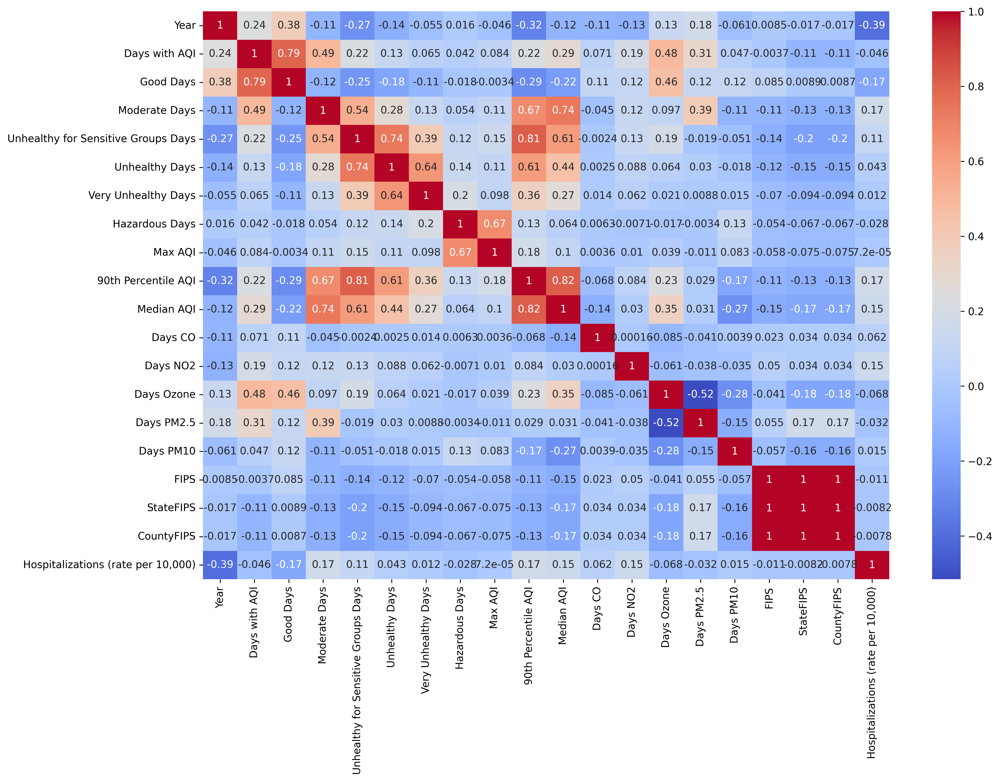

In [49]:
aqi_hosp_adjusted = aqi_hosp.drop(columns=['geometry', 'State', 'County'])
fig, axes = plt.subplots(1, 1, figsize=(15, 10), dpi=300)
sns.heatmap(aqi_hosp_adjusted.corr(), annot=True, cmap='coolwarm')

In [50]:
counties = aqi_hosp['County'].unique()

for county in counties:
    
    # Filter the data for the current county
    county_data = aqi_hosp[aqi_hosp['County'] == county]
    
    # Exclude non-numeric columns
    numeric_columns = county_data.select_dtypes(include='number')
    
    corr_matrix = numeric_columns.corr()
    
    # Tail of the correlation matrix
    tail_corr_values = corr_matrix.iloc[-1]
    
    print(f"Correlation values for {county} County:")
    print(tail_corr_values)
    print()

Correlation values for Abbeville County:
Year                                  -0.563650
Days with AQI                          0.400663
Good Days                             -0.048567
Moderate Days                          0.300886
Unhealthy for Sensitive Groups Days    0.442367
Unhealthy Days                         0.460278
Very Unhealthy Days                         NaN
Hazardous Days                              NaN
Max AQI                                0.350918
90th Percentile AQI                    0.523335
Median AQI                             0.332921
Days CO                                     NaN
Days NO2                                    NaN
Days Ozone                             0.400663
Days PM2.5                                  NaN
Days PM10                                   NaN
StateFIPS                                   NaN
CountyFIPS                                  NaN
Hospitalizations (rate per 10,000)     1.000000
Name: Hospitalizations (rate per 10,000), dtype

In [51]:
counties = aqi_hosp['County'].unique()

# Dict with correlation values
correlation_values = {}
for county in counties:
    county_data = aqi_hosp[aqi_hosp['County'] == county]
    numeric_columns = county_data.select_dtypes(include='number')
    corr_matrix = numeric_columns.corr()
    
    # Correlation values for pollutants
    relevant_corr_values = corr_matrix.loc[['Days CO', 'Days NO2', 'Days Ozone', 'Days PM2.5', 'Days PM10']]
    
    avg_corr = relevant_corr_values.mean().mean()
    
    correlation_values[county] = avg_corr

# Sort counties based on the average correlation with pollutants
sorted_counties = sorted(correlation_values, key=correlation_values.get, reverse=True)

for county in sorted_counties:
    county_data = aqi_hosp[aqi_hosp['County'] == county]
    numeric_columns = county_data.select_dtypes(include='number')
    corr_matrix = numeric_columns.corr()
    tail_corr_values = corr_matrix.iloc[-1]
    
    print(f"Correlation values for {county} County:")
    print(tail_corr_values)
    print()

Correlation values for Alpena County:
Year                                  -1.0
Days with AQI                          1.0
Good Days                              1.0
Moderate Days                          1.0
Unhealthy for Sensitive Groups Days    1.0
Unhealthy Days                         NaN
Very Unhealthy Days                    NaN
Hazardous Days                         NaN
Max AQI                                1.0
90th Percentile AQI                    1.0
Median AQI                            -1.0
Days CO                                NaN
Days NO2                               NaN
Days Ozone                             NaN
Days PM2.5                             1.0
Days PM10                              NaN
StateFIPS                              NaN
CountyFIPS                             NaN
Hospitalizations (rate per 10,000)     1.0
Name: Hospitalizations (rate per 10,000), dtype: float64

Correlation values for Barbour County:
Year                                  NaN
Days w

In [52]:
## Note: This is with NaN values removed for the pollutants


# Dict with correlation values
correlation_values = {}
for county in counties:
    county_data = aqi_hosp[aqi_hosp['County'] == county]
    numeric_columns = county_data.select_dtypes(include='number')
    corr_matrix = numeric_columns.corr()
    
    # Correlation values for pollutants
    relevant_corr_values = corr_matrix.loc[['Days CO', 'Days NO2', 'Days Ozone', 'Days PM2.5', 'Days PM10']]
    
    # Exclude counties with all NaN values for the specified columns
    if not relevant_corr_values.isnull().all().any():
        avg_corr = relevant_corr_values.mean().mean()
        
        correlation_values[county] = avg_corr

# Sort counties based on the average correlation with pollutants
sorted_counties = sorted(correlation_values, key=correlation_values.get, reverse=True)

for county in sorted_counties:
    county_data = aqi_hosp[aqi_hosp['County'] == county]
    numeric_columns = county_data.select_dtypes(include='number')
    corr_matrix = numeric_columns.corr()
    tail_corr_values = corr_matrix.iloc[-1]
    
    print(f"Correlation values for {county} County:")
    print(tail_corr_values)
    print()

Correlation values for Jackson County:
Year                                  -0.428444
Days with AQI                          0.359284
Good Days                              0.000079
Moderate Days                          0.708113
Unhealthy for Sensitive Groups Days    0.128348
Unhealthy Days                        -0.199151
Very Unhealthy Days                   -0.235855
Hazardous Days                        -0.141590
Max AQI                                0.001332
90th Percentile AQI                    0.403581
Median AQI                             0.601133
Days CO                                0.055724
Days NO2                               0.662789
Days Ozone                            -0.346061
Days PM2.5                             0.435953
Days PM10                              0.189569
StateFIPS                              0.253138
CountyFIPS                             0.254988
Hospitalizations (rate per 10,000)     1.000000
Name: Hospitalizations (rate per 10,000), dtype: 

In [53]:
"""import seaborn as sns
import matplotlib.pyplot as plt

# Get the first 10 counties
counties = aqi_hosp['County'].unique()[:10]

# Iterate over each county
for county in counties:
    # Filter the data for the current county
    county_data = aqi_hosp[aqi_hosp['County'] == county]
    numeric_columns = county_data.select_dtypes(include='number')
    # Drop unnecessary columns
    #county_data_adjusted = county_data.drop(columns=['geometry', 'State', 'County'])
    
    # Create a heatmap for the current county
    fig, axes = plt.subplots(1, 1, figsize=(15, 10), dpi=300)
    sns.heatmap(numeric_columns.corr(), annot=True, cmap='coolwarm')
    plt.title(f'Correlation Heatmap for {county} County')
    plt.show()"""

"""aqi_hosp_adjusted = aqi_hosp.drop(columns=['geometry', 'State', 'County'])
fig, axes = plt.subplots(1, 1, figsize=(15, 10), dpi=300)
sns.heatmap(aqi_hosp_adjusted.corr(), annot=True, cmap='coolwarm')"""


"aqi_hosp_adjusted = aqi_hosp.drop(columns=['geometry', 'State', 'County'])\nfig, axes = plt.subplots(1, 1, figsize=(15, 10), dpi=300)\nsns.heatmap(aqi_hosp_adjusted.corr(), annot=True, cmap='coolwarm')"

In [54]:
#correlation by variable for all counties
aqi_hosp.corr().tail(1)

TypeError: float() argument must be a string or a real number, not 'Polygon'

In [59]:
# Count the NaN values in the 'Days CO' column of the 'aqi_hosp' DataFrame
nan_count = aqi_hosp['Hospitalizations (rate per 10,000)'].isna().sum()
print(nan_count)

aqi_hosp_nonans = aqi_hosp['Hospitalizations (rate per 10,000)'].dropna


11156


## Asthma ER Visits and Air Quality

In [60]:
aqi_er = pd.merge(all_aqi_data, asthma_er, on = ['State', 'County', 'Year'], how = 'left')

In [61]:
# New Group A - Increasing ER visits for Asthma
print(ER_IncA_full.shape)
aqi_erA = pd.merge(ER_IncA_full, all_aqi_data, on = ['State', 'County', 'Year'], how = 'left')
print(aqi_erA.shape)

aqi_erA_nonan = aqi_erA.dropna()
print(aqi_erA_nonan.shape)

aqi_erA_hm = aqi_erA_nonan.drop(columns=['geometry', 'State', 'County', 'cname', 'slope', 'Year', 'CountyFIPS', 'StateFIPS'])
fig, axes = plt.subplots(1, 1, figsize=(15, 10), dpi=300)
sns.heatmap(aqi_erA_hm.corr(), annot=True, cmap='coolwarm')

NameError: name 'ER_IncA_full' is not defined

In [62]:
# New Group B - Decreasing ER visits for Asthma

aqi_erB = pd.merge(ER_DecB_full, all_aqi_data, on = ['State', 'County', 'Year'], how = 'left')
print(aqi_erB.shape)

aqi_erB_nonan = aqi_erB.dropna()
print(aqi_erB_nonan.shape)

aqi_erB_hm = aqi_erB_nonan.drop(columns=['geometry', 'State', 'County', 'cname', 'slope', 'Year', 'CountyFIPS', 'StateFIPS'])
fig, axes = plt.subplots(1, 1, figsize=(15, 10), dpi=300)
sns.heatmap(aqi_erB_hm.corr(), annot=True, cmap='coolwarm')


NameError: name 'ER_DecB_full' is not defined

In [63]:
# New Group C - Neutral ER visits for Asthma

aqi_erC = pd.merge(ER_neutralC_full, all_aqi_data, on = ['State', 'County', 'Year'], how = 'left')
print(aqi_erC.shape)

aqi_erC_nonan = aqi_erC.dropna()
print(aqi_erC_nonan.shape)

aqi_erC_hm = aqi_erC_nonan.drop(columns=['geometry', 'State', 'County', 'cname', 'slope', 'Year', 'CountyFIPS', 'StateFIPS'])
fig, axes = plt.subplots(1, 1, figsize=(15, 10), dpi=300)
sns.heatmap(aqi_erC_hm.corr(), annot=True, cmap='coolwarm')


NameError: name 'ER_neutralC_full' is not defined

In [64]:
aqi_er.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23542 entries, 0 to 23541
Data columns (total 23 columns):
 #   Column                                  Non-Null Count  Dtype   
---  ------                                  --------------  -----   
 0   State                                   23542 non-null  object  
 1   County                                  23542 non-null  object  
 2   Year                                    23542 non-null  int64   
 3   Days with AQI                           23542 non-null  int64   
 4   Good Days                               23542 non-null  int64   
 5   Moderate Days                           23542 non-null  int64   
 6   Unhealthy for Sensitive Groups Days     23542 non-null  int64   
 7   Unhealthy Days                          23542 non-null  int64   
 8   Very Unhealthy Days                     23542 non-null  int64   
 9   Hazardous Days                          23542 non-null  int64   
 10  Max AQI                                 23542 

<Axes: >

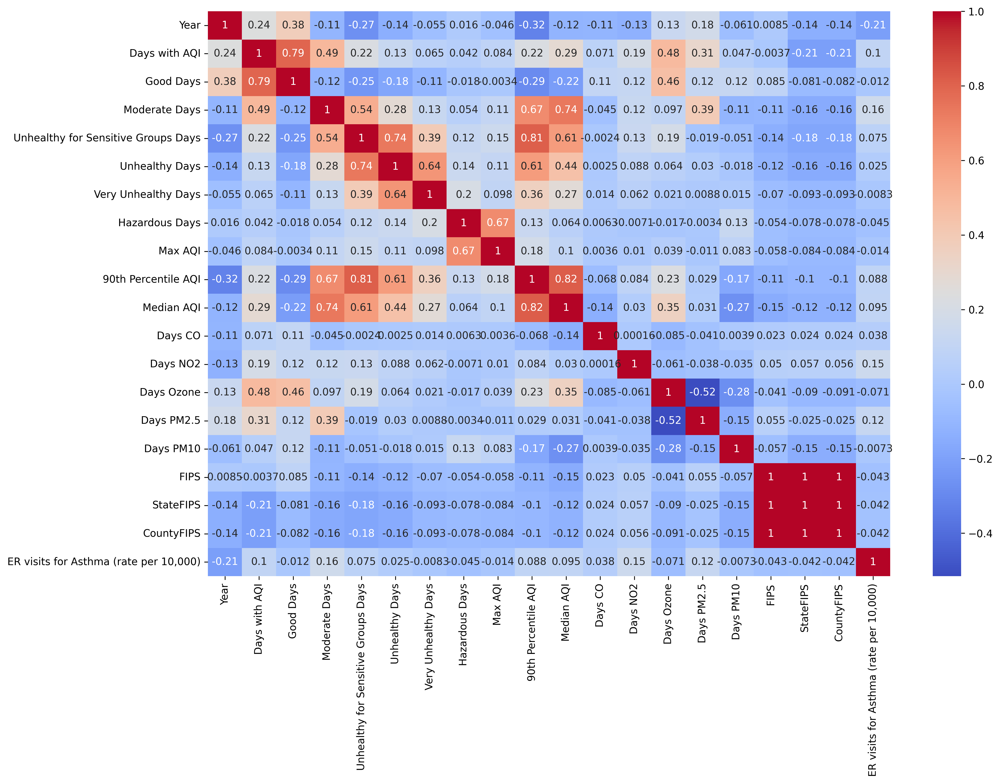

In [65]:
aqi_er_adjusted= aqi_er.drop(columns=['geometry', 'State', 'County'])
fig, axes = plt.subplots(1, 1, figsize=(15, 10), dpi=300)
sns.heatmap(aqi_er_adjusted.corr(), annot=True, cmap='coolwarm')

# Correlation Dataframes

In [66]:
hosp_aqi_corr = pd.DataFrame()

# Iterate over each county
for county in aqi_hosp['County'].unique():
    cname = county
    state = aqi_hosp[aqi_hosp['County'] == county]['State'].unique()[0]
    county_df = aqi_hosp[aqi_hosp['County'] == county].corr()
    county_df.insert(0, "County", cname, True)
    county_df.insert(1, "State", state, True)

    tail_end = county_df.tail(1)
    hosp_aqi_corr = pd.concat([hosp_aqi_corr, tail_end])

#hosp_aqi_corr = hosp_aqi_corr.drop(columns = ['Year']) #year corr values don't tell us anything
hosp_aqi_corr.tail(3)
#aqi_hosp.corr().tail(1)

TypeError: float() argument must be a string or a real number, not 'Polygon'

In [67]:
prev_aqi_corr = pd.DataFrame()

# Iterate over each county
for county in aqi_prev['County'].unique():
    cname = county
    state = aqi_prev[aqi_prev['County'] == county]['State'].unique()[0]
    county_df = aqi_prev[aqi_prev['County'] == county].corr()
    county_df.insert(0, "County", cname, True)
    county_df.insert(1, "State", state, True)

    tail_end = county_df.tail(1)
    prev_aqi_corr = pd.concat([prev_aqi_corr, tail_end])

#hosp_aqi_corr = hosp_aqi_corr.drop(columns = ['Year']) #year corr values don't tell us anything
prev_aqi_corr.tail(3)
#aqi_hosp.corr().tail(1)

TypeError: float() argument must be a string or a real number, not 'Polygon'

In [68]:
er_aqi_corr = pd.DataFrame()

# Iterate over each county
for county in aqi_er['County'].unique():
    cname = county
    state = aqi_er[aqi_er['County'] == county]['State'].unique()[0]
    county_df = aqi_er[aqi_er['County'] == county].corr()
    county_df.insert(0, "County", cname, True)
    county_df.insert(1, "State", state, True)

    tail_end = county_df.tail(1)
    er_aqi_corr = pd.concat([er_aqi_corr, tail_end])

#hosp_aqi_corr = hosp_aqi_corr.drop(columns = ['Year']) #year corr values don't tell us anything
er_aqi_corr.tail(3)
#aqi_hosp.corr().tail(1)

TypeError: float() argument must be a string or a real number, not 'Polygon'

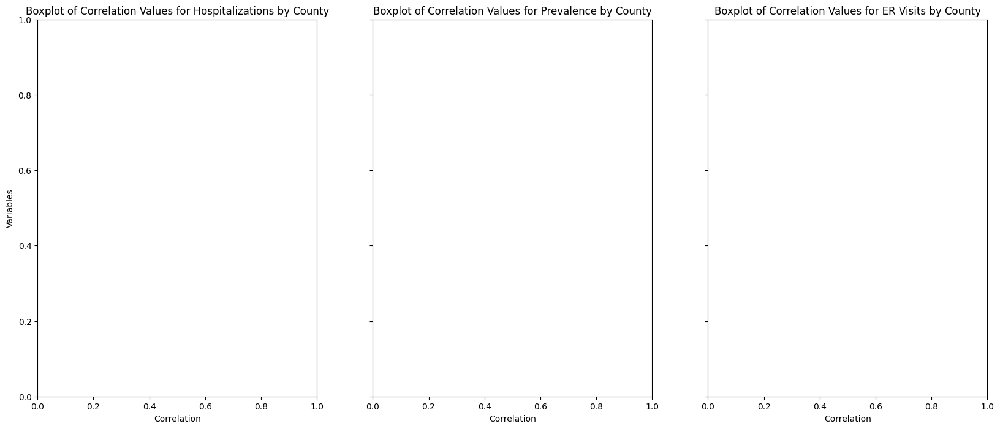

In [69]:
fig, axs = plt.subplots(1, 3, figsize=(20, 8))

sns.boxplot(ax=axs[0], data=hosp_aqi_corr, orient='h')
axs[0].set_title("Boxplot of Correlation Values for Hospitalizations by County")
axs[0].set_xlabel('Correlation')
axs[0].set_ylabel('Variables')


sns.boxplot(ax=axs[1], data=prev_aqi_corr, orient='h')
axs[1].set_title("Boxplot of Correlation Values for Prevalence by County")
axs[1].set_xlabel('Correlation')
axs[1].set_yticklabels([])

sns.boxplot(ax=axs[2], data=er_aqi_corr, orient='h')
axs[2].set_title("Boxplot of Correlation Values for ER Visits by County")
axs[2].set_xlabel('Correlation')
axs[2].set_yticklabels([])

plt.show()


# Models for ER Group A (Increasing)

In [70]:
#aqi_erA.info()
#aqi_erA.isnull().sum()
aqi_erA.tail(10)
aqi_erA_adj = aqi_erA.dropna()
aqi_erA_adj.shape


NameError: name 'aqi_erA' is not defined

## Random Forest

In [71]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

feature_cols = ['Days with AQI', 'Moderate Days', 'Median AQI', 'Days CO', 'Days NO2', 'Days PM2.5', 'Days PM10']

X_er = aqi_erA_adj[feature_cols]
y_er = aqi_erA_adj['ER visits for Asthma (rate per 10,000)']

X_train_er, X_test_er, y_train_er, y_test_er = train_test_split(X_er, y_er, test_size = 0.3, random_state = 42)


NameError: name 'aqi_erA_adj' is not defined

In [72]:
model_er = RandomForestRegressor(n_estimators = 100, random_state = 42)

model_er.fit(X_train_er, y_train_er)
predictions_er = model_er.predict(X_test_er)

mse_er = mean_squared_error(y_test_er, predictions_er)
r2_er = r2_score(y_test_er, predictions_er)

print('ER Visits')
print(f'MSE: {mse_er}')
print(f'R^2 Score: {r2_er}')

# Function to plot actual vs. predicted values
def plot_actual_vs_predicted(y_actual, y_predicted, title):
    plt.figure(figsize=(10, 6))
    plt.scatter(y_actual, y_predicted, alpha=0.6)
    plt.plot([y_actual.min(), y_actual.max()], [y_actual.min(), y_actual.max()], 'r--', lw=2)
    plt.xlabel('Actual')
    plt.ylabel('Predicted')
    plt.title(title)
    plt.show()

plot_actual_vs_predicted(y_test_er, predictions_er, 'Group A - ER Visits: Actual vs. Predicted')

# Feature Importance
feature_importances_er = model_er.feature_importances_
features_er = X_er.columns
feature_importances_df_er = pd.DataFrame({'feature': features_er, 'importance': feature_importances_er})
feature_importances_df_er = feature_importances_df_er.sort_values('importance', ascending=False)
feature_importances_df_er

NameError: name 'X_train_er' is not defined

## Multiple Linear Regression

In [73]:
#Fitting the Multiple Linear Regression model
mlr = LinearRegression()  
mlr.fit(X_train_er, y_train_er)

#Intercept and Coefficient
print("Intercept: ", mlr.intercept_)
print("Coefficients:")
list(zip(feature_cols, mlr.coef_))

#Prediction of test set
y_pred_mlr= mlr.predict(X_test_er)
#Predicted values
#print("Prediction for test set: {}".format(y_pred_mlr))

mlr_diff = pd.DataFrame({'Actual value': y_test_er, 'Predicted value': y_pred_mlr})
mlr_diff.head()

#Model Evaluation
from sklearn import metrics
meanAbErr = metrics.mean_absolute_error(y_test_er, y_pred_mlr)
meanSqErr = metrics.mean_squared_error(y_test_er, y_pred_mlr)
rootMeanSqErr = np.sqrt(metrics.mean_squared_error(y_test_er, y_pred_mlr))
print('R squared: {:.2f}'.format(mlr.score(X_er,y_er)*100))
print('Mean Absolute Error:', meanAbErr)
print('Mean Square Error:', meanSqErr)
print('Root Mean Square Error:', rootMeanSqErr)

import matplotlib.pyplot as plt



NameError: name 'X_train_er' is not defined

## ARIMAX

In [74]:
import pandas as pd
import statsmodels.api as sm

# Create a DataFrame with all the independent variables
X = aqi_erA_adj[feature_cols]

# Add a constant to the DataFrame
X = sm.add_constant(X)

# Create a Series with the dependent variable
y = aqi_erA_adj['ER visits for Asthma (rate per 10,000)']

# Create a model
model = sm.OLS(y, X).fit()

# Get the summary of the model
print(model.summary())
print("Parameters: ", model.params)
print("R2: ", model.rsquared)



ModuleNotFoundError: No module named 'statsmodels'

# Models for ER Group B (Decreasing)

In [75]:
#print(aqi_erB.tail(10))
aqi_erB_adj = aqi_erB.dropna()
aqi_erB_adj.shape

NameError: name 'aqi_erB' is not defined

## Random Forest

In [76]:
aqi_erB_adj.columns

NameError: name 'aqi_erB_adj' is not defined

In [77]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

feature_cols = ['Days with AQI', 'Moderate Days', 'Max AQI', 'Days NO2', 'Days PM2.5', 'Days PM10']

X_er = aqi_erB_adj[feature_cols]
y_er = aqi_erB_adj['ER visits for Asthma (rate per 10,000)']

X_train_er, X_test_er, y_train_er, y_test_er = train_test_split(X_er, y_er, test_size = 0.3, random_state = 42)

NameError: name 'aqi_erB_adj' is not defined

In [78]:
model_er = RandomForestRegressor(n_estimators = 100, random_state = 42)

model_er.fit(X_train_er, y_train_er)
predictions_er = model_er.predict(X_test_er)

mse_er = mean_squared_error(y_test_er, predictions_er)
r2_er = r2_score(y_test_er, predictions_er)

print('ER Visits')
print(f'MSE: {mse_er}')
print(f'R^2 Score: {r2_er}')

# Function to plot actual vs. predicted values
def plot_actual_vs_predicted(y_actual, y_predicted, title):
    plt.figure(figsize=(10, 6))
    plt.scatter(y_actual, y_predicted, alpha=0.6)
    plt.plot([y_actual.min(), y_actual.max()], [y_actual.min(), y_actual.max()], 'r--', lw=2)
    plt.xlabel('Actual')
    plt.ylabel('Predicted')
    plt.title(title)
    plt.show()

plot_actual_vs_predicted(y_test_er, predictions_er, 'Group B - ER Visits: Actual vs. Predicted')

NameError: name 'X_train_er' is not defined

# Models for ER Group C (Neutral)

In [79]:
aqi_erC_adj = aqi_erC.dropna()
aqi_erC_adj.shape

NameError: name 'aqi_erC' is not defined

In [80]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

feature_cols = ['Days with AQI', 'Moderate Days', '90th Percentile AQI', 'Median AQI', 'Days CO', 'Days NO2', 'Days PM2.5']

X_er = aqi_erC_adj[feature_cols]
y_er = aqi_erC_adj['ER visits for Asthma (rate per 10,000)']

X_train_er, X_test_er, y_train_er, y_test_er = train_test_split(X_er, y_er, test_size = 0.3, random_state = 42)

NameError: name 'aqi_erC_adj' is not defined

In [81]:
model_er = RandomForestRegressor(n_estimators = 100, random_state = 42)

model_er.fit(X_train_er, y_train_er)
predictions_er = model_er.predict(X_test_er)

mse_er = mean_squared_error(y_test_er, predictions_er)
r2_er = r2_score(y_test_er, predictions_er)

print('ER Visits')
print(f'MSE: {mse_er}')
print(f'R^2 Score: {r2_er}')

# Function to plot actual vs. predicted values
def plot_actual_vs_predicted(y_actual, y_predicted, title):
    plt.figure(figsize=(10, 6))
    plt.scatter(y_actual, y_predicted, alpha=0.6)
    plt.plot([y_actual.min(), y_actual.max()], [y_actual.min(), y_actual.max()], 'r--', lw=2)
    plt.xlabel('Actual')
    plt.ylabel('Predicted')
    plt.title(title)
    plt.show()

plot_actual_vs_predicted(y_test_er, predictions_er, 'Group C - ER Visits: Actual vs. Predicted')

NameError: name 'X_train_er' is not defined

# Random Forests

In [82]:
# Remove NaN values
aqi_hosp = aqi_hosp.dropna(subset=['Hospitalizations (rate per 10,000)'])
aqi_prev = aqi_prev.dropna(subset=['Prevalence %'])
aqi_er = aqi_er.dropna(subset=['ER visits for Asthma (rate per 10,000)'])

# Look at Yuma County, AZ
aqi_hosp = aqi_hosp[aqi_hosp['FIPS'] == '04027']
aqi_prev = aqi_prev[aqi_prev['FIPS'] == '04027']
aqi_er = aqi_er[aqi_er['FIPS'] == '04027']

In [83]:
# Define features 
feature_cols = ['Days PM2.5', 'Unhealthy for Sensitive Groups Days']
X_hosp = aqi_hosp[feature_cols]
X_prev = aqi_prev[feature_cols]
X_er = aqi_er[feature_cols]

# Define targets
y_hosp = aqi_hosp['Hospitalizations (rate per 10,000)']
y_prev = aqi_prev['Prevalence %']
y_er = aqi_er['ER visits for Asthma (rate per 10,000)']

In [84]:
# Split the dataset
X_train_hosp, X_test_hosp, y_train_hosp, y_test_hosp = train_test_split(X_hosp, y_hosp, test_size = 0.3, random_state = 42)
X_train_prev, X_test_prev, y_train_prev, y_test_prev = train_test_split(X_prev, y_prev, test_size = 0.3, random_state = 42)
X_train_er, X_test_er, y_train_er, y_test_er = train_test_split(X_er, y_er, test_size = 0.3, random_state = 42)

In [85]:
# Initialize Random Forest Regressor model
model_hosp = RandomForestRegressor(n_estimators = 100, random_state = 42)
model_prev = RandomForestRegressor(n_estimators = 100, random_state = 42)
model_er = RandomForestRegressor(n_estimators = 100, random_state = 42)

In [86]:
# Train the model on the dataset
model_hosp.fit(X_train_hosp, y_train_hosp)
model_prev.fit(X_train_prev, y_train_prev)
model_er.fit(X_train_er, y_train_er)

# Predict on the test set
predictions_hosp = model_hosp.predict(X_test_hosp)
predictions_prev = model_prev.predict(X_test_prev)
predictions_er = model_er.predict(X_test_er)

In [87]:
# Evaluate the model
mse_hosp = mean_squared_error(y_test_hosp, predictions_hosp)
mse_prev = mean_squared_error(y_test_prev, predictions_prev)
mse_er = mean_squared_error(y_test_er, predictions_er)

r2_hosp = r2_score(y_test_hosp, predictions_hosp)
r2_prev = r2_score(y_test_prev, predictions_prev)
r2_er = r2_score(y_test_er, predictions_er)

print('Hospitalizations')
print(f'MSE: {mse_hosp}')
print(f'R^2 Score: {r2_hosp}')
print('')
print('Asthma Prevalence')
print(f'MSE: {mse_prev}')
print(f'R^2 Score: {r2_prev}')
print('')
print('ER Visits')
print(f'MSE: {mse_er}')
print(f'R^2 Score: {r2_er}')

Hospitalizations
MSE: 4.572973999999998
R^2 Score: 0.5566556324563059

Asthma Prevalence
MSE: 0.20000000000001245
R^2 Score: -4.000000000000302

ER Visits
MSE: 12.739261166666616
R^2 Score: 0.8299063132362111


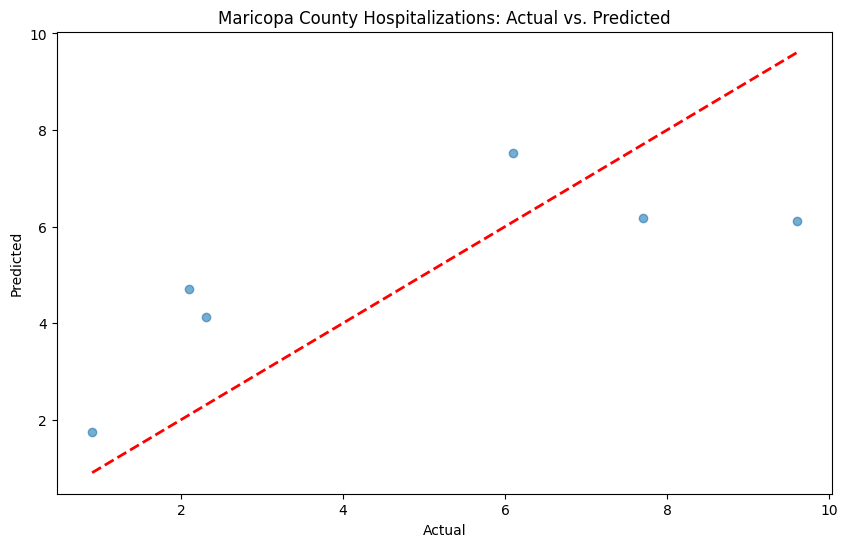

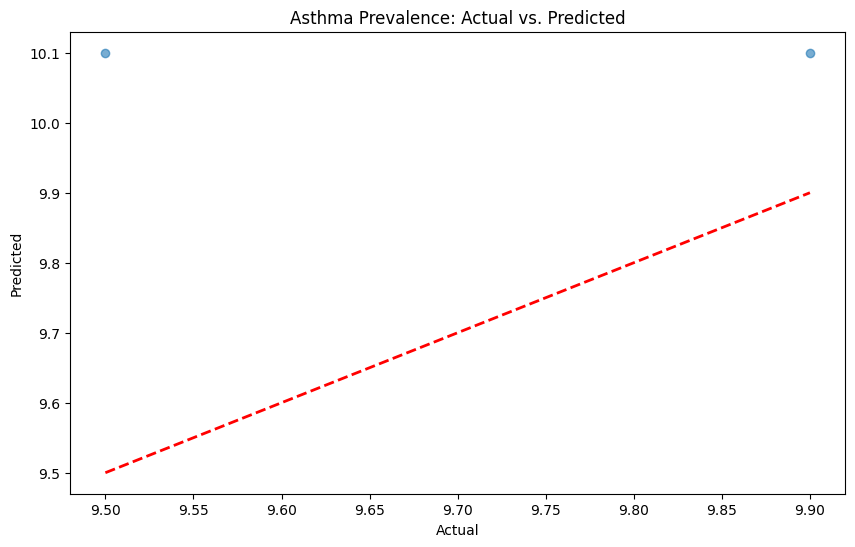

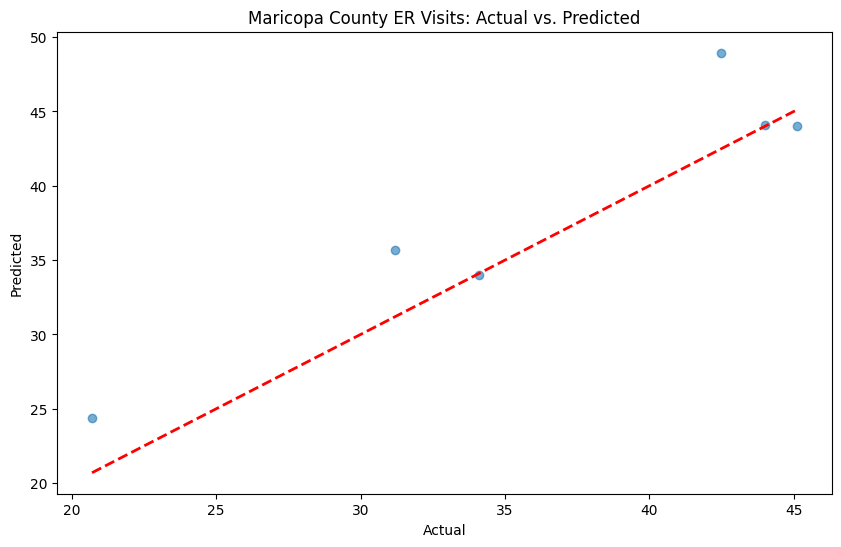

In [88]:
# Function to plot actual vs. predicted values
def plot_actual_vs_predicted(y_actual, y_predicted, title):
    plt.figure(figsize=(10, 6))
    plt.scatter(y_actual, y_predicted, alpha=0.6)
    plt.plot([y_actual.min(), y_actual.max()], [y_actual.min(), y_actual.max()], 'r--', lw=2)
    plt.xlabel('Actual')
    plt.ylabel('Predicted')
    plt.title(title)
    plt.show()

# Plot for each model
plot_actual_vs_predicted(y_test_hosp, predictions_hosp, 'Maricopa County Hospitalizations: Actual vs. Predicted')
plot_actual_vs_predicted(y_test_prev, predictions_prev, 'Asthma Prevalence: Actual vs. Predicted')
plot_actual_vs_predicted(y_test_er, predictions_er, 'Maricopa County ER Visits: Actual vs. Predicted')

# ARIMA

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error, r2_score

# Remove NaN values
aqi_hosp_ARIMA = aqi_hosp.dropna(subset=['Hospitalizations (rate per 10,000)'])
aqi_prev_ARIMA = aqi_prev.dropna(subset=['Prevalence %'])
aqi_er_ARIMA = aqi_er.dropna(subset=['ER visits for Asthma (rate per 10,000)'])

# Look at Yuma County, AZ
aqi_hosp_ARIMA = aqi_hosp_ARIMA[aqi_hosp_ARIMA['FIPS'] == '04027']
aqi_prev_ARIMA = aqi_prev_ARIMA[aqi_prev_ARIMA['FIPS'] == '04027']
aqi_er_ARIMA = aqi_er_ARIMA[aqi_er_ARIMA['FIPS'] == '04027']

# Define features 
feature_cols_ARIMA = ['Days PM2.5', 'Unhealthy for Sensitive Groups Days']
X_hosp_ARIMA = aqi_hosp_ARIMA[feature_cols_ARIMA]
X_prev_ARIMA = aqi_prev_ARIMA[feature_cols_ARIMA]
X_er_ARIMA = aqi_er_ARIMA[feature_cols_ARIMA]

# Define targets
y_hosp_ARIMA = aqi_hosp_ARIMA['Hospitalizations (rate per 10,000)']
y_prev_ARIMA = aqi_prev_ARIMA['Prevalence %']
y_er_ARIMA = aqi_er_ARIMA['ER visits for Asthma (rate per 10,000)']

# Split the dataset
X_train_hosp_ARIMA, X_test_hosp_ARIMA, y_train_hosp_ARIMA, y_test_hosp_ARIMA = train_test_split(X_hosp_ARIMA, y_hosp_ARIMA, test_size=0.3, random_state=42)
X_train_prev_ARIMA, X_test_prev_ARIMA, y_train_prev_ARIMA, y_test_prev_ARIMA = train_test_split(X_prev_ARIMA, y_prev_ARIMA, test_size=0.3, random_state=42)
X_train_er_ARIMA, X_test_er_ARIMA, y_train_er_ARIMA, y_test_er_ARIMA = train_test_split(X_er_ARIMA, y_er_ARIMA, test_size=0.3, random_state=42)

# Define ARIMA models
model_hosp_ARIMA = ARIMA(y_train_hosp_ARIMA, order=(1,0,0))
model_prev_ARIMA = ARIMA(y_train_prev_ARIMA, order=(1,0,0))
model_er_ARIMA = ARIMA(y_train_er_ARIMA, order=(1,0,0))

# Train the models on the dataset
model_hosp_ARIMA_fit = model_hosp_ARIMA.fit()
model_prev_ARIMA_fit = model_prev_ARIMA.fit()
model_er_ARIMA_fit = model_er_ARIMA.fit()

# Debugging: Check if the models are successfully trained
print("Models trained successfully!")

# Predict on the test set
predictions_hosp_ARIMA = model_hosp_ARIMA_fit.predict(start=len(X_train_hosp_ARIMA), end=len(X_train_hosp_ARIMA)+len(X_test_hosp_ARIMA)-1)
predictions_prev_ARIMA = model_prev_ARIMA_fit.predict(start=len(X_train_prev_ARIMA), end=len(X_train_prev_ARIMA)+len(X_test_prev_ARIMA)-1)
predictions_er_ARIMA = model_er_ARIMA_fit.predict(start=len(X_train_er_ARIMA), end=len(X_train_er_ARIMA)+len(X_test_er_ARIMA)-1)

# Evaluate the models
mse_hosp_ARIMA = mean_squared_error(y_test_hosp_ARIMA, predictions_hosp_ARIMA)
r2_hosp_ARIMA = r2_score(y_test_hosp_ARIMA, predictions_hosp_ARIMA)

mse_prev_ARIMA = mean_squared_error(y_test_prev_ARIMA, predictions_prev_ARIMA)
r2_prev_ARIMA = r2_score(y_test_prev_ARIMA, predictions_prev_ARIMA)

mse_er_ARIMA = mean_squared_error(y_test_er_ARIMA, predictions_er_ARIMA)
r2_er_ARIMA = r2_score(y_test_er_ARIMA, predictions_er_ARIMA)

print("Hospitalizations")
print("MSE:", mse_hosp_ARIMA)
print("R^2 Score:", r2_hosp_ARIMA)
print()
print("Asthma Prevalence")
print("MSE:", mse_prev_ARIMA)
print("R^2 Score:", r2_prev_ARIMA)
print()
print("ER Visits")
print("MSE:", mse_er_ARIMA)
print("R^2 Score:", r2_er_ARIMA)

In [ ]:
#Actual vs Predicted Scatter Plot
plt.figure(figsize=(12, 6))
plt.subplot(3, 1, 1)
plt.scatter(y_test_hosp_ARIMA, predictions_hosp_ARIMA)
plt.title('Actual vs Predicted for Hospitalizations')
plt.xlabel('Actual')
plt.ylabel('Predicted')

plt.subplot(3, 1, 2)
plt.scatter(y_test_prev_ARIMA, predictions_prev_ARIMA)
plt.title('Actual vs Predicted for Asthma Prevalence')
plt.xlabel('Actual')
plt.ylabel('Predicted')

plt.subplot(3, 1, 3)
plt.scatter(y_test_er_ARIMA, predictions_er_ARIMA)
plt.title('Actual vs Predicted for ER Visits')
plt.xlabel('Actual')
plt.ylabel('Predicted')

plt.tight_layout()
plt.show()

### EXTRA EDA

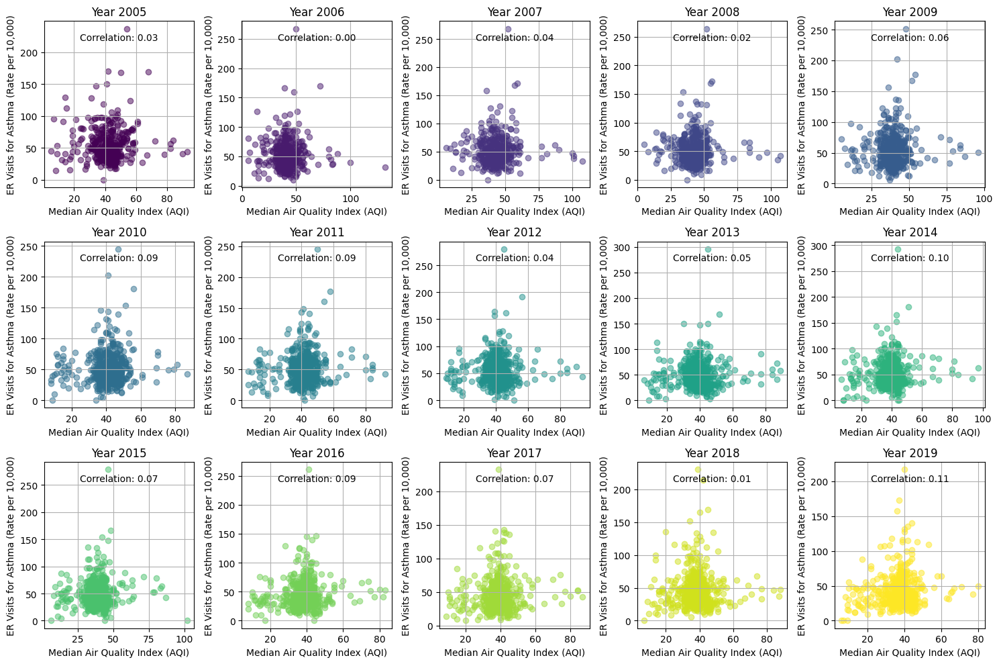

In [96]:
fig, axes = plt.subplots(3, 5, figsize=(15, 10))
colors = plt.cm.viridis(np.linspace(0, 1, 15))

for i, year in enumerate(range(2005, 2020)):
    asthma_er_df_year = aqi_er_adjusted[aqi_er_adjusted['Year'] == year]
    
    row = i // 5
    col = i % 5
    
    # Scatterplot for 2005 - 2019
    axes[row, col].scatter(asthma_er_df_year['Median AQI'], asthma_er_df_year['ER visits for Asthma (rate per 10,000)'], alpha=0.5, color=colors[i])
    axes[row, col].set_xlabel('Median Air Quality Index (AQI)')
    axes[row, col].set_ylabel('ER Visits for Asthma (Rate per 10,000)')
    axes[row, col].set_title(f'Year {year}')
    axes[row, col].grid(True)

    # Correlation coefficient
    correlation_coefficient = asthma_er_df_year['Median AQI'].corr(asthma_er_df_year['ER visits for Asthma (rate per 10,000)'], method='pearson')
    if not np.isnan(correlation_coefficient):
        axes[row, col].text(0.5, 0.9, f'Correlation: {correlation_coefficient:.2f}', horizontalalignment='center', verticalalignment='center', transform=axes[row, col].transAxes)
    else:
        axes[row, col].text(0.5, 0.9, 'Correlation: NaN', horizontalalignment='center', verticalalignment='center', transform=axes[row, col].transAxes)

plt.tight_layout()

plt.show()

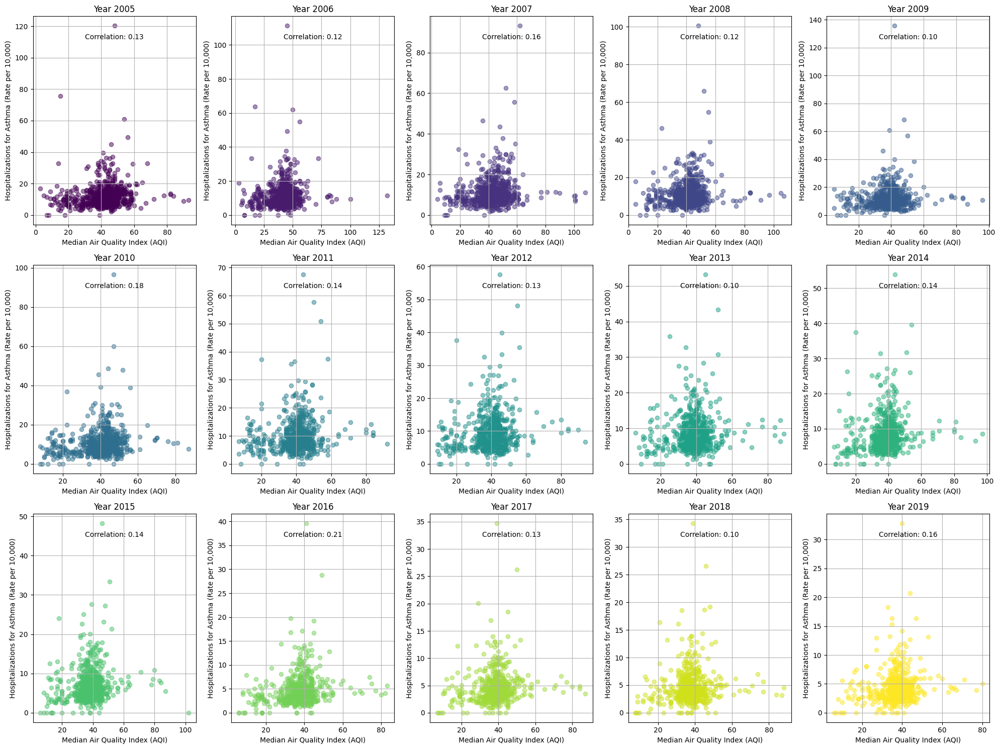

In [94]:
fig, axes = plt.subplots(3, 5, figsize=(20, 15))


for i, year in enumerate(range(2005, 2020)):
    asthma_hosp_df_year = aqi_hosp_adjusted[aqi_hosp_adjusted['Year'] == year]
    
    row = i // 5
    col = i % 5
    
    # Scatterplot for 2005 - 2019
    axes[row, col].scatter(asthma_hosp_df_year['Median AQI'], asthma_hosp_df_year['Hospitalizations (rate per 10,000)'], alpha=0.5, color=colors[i])
    axes[row, col].set_xlabel('Median Air Quality Index (AQI)')
    axes[row, col].set_ylabel('Hospitalizations for Asthma (Rate per 10,000)')
    axes[row, col].set_title(f'Year {year}')
    axes[row, col].grid(True)

    # Correlation coefficient
    correlation_coefficient = asthma_hosp_df_year['Median AQI'].corr(asthma_hosp_df_year['Hospitalizations (rate per 10,000)'], method='pearson')
    if not np.isnan(correlation_coefficient):
        axes[row, col].text(0.5, 0.9, f'Correlation: {correlation_coefficient:.2f}', horizontalalignment='center', verticalalignment='center', transform=axes[row, col].transAxes)
    else:
        axes[row, col].text(0.5, 0.9, 'Correlation: NaN', horizontalalignment='center', verticalalignment='center', transform=axes[row, col].transAxes)

plt.tight_layout()

plt.show()

# Discussion

### Asthma Datasets
The distribution of Asthma prevalence values is similar to a normal distribution.  While hospitalizations and ER visits are left skewed.  

The Asthma datasets for ER visits due to asthma and hospitalizations due to asthma run from 2000-2021, while prevalence only spans 2018-2021 as this data came from a relatively new survey project by the CDC.  

The asthma prevalence data spans 25 states, the asthma hospitalization dataset spans 32 states, and the asthma ER visits dataset spans 25 states by 2009.  Because state reporting is not always consistent in these datasets, this could affect prediction models in our project and will have to be kept in mind.  

### Air Quality Datasets
The air quality data was combined with geospatial identifiers in order to track and compare with the asthma datasets.  

In the geospatial maps spanning 2000 to 2019, we observe a notable increase in AQI values, visually depicted by darker shading in the west coast, primarily California and Arizona. Simultaneously, the east coast shows a steady rise in AQI concentrations. Urban population-dense areas also exhibit a slight but consistent increase. These trends highlight dynamic changes and patterns in air quality over the past two decades.

Some variables in the air quality data seem to track with eachother based on the heatmap such as Hazardous days and Max AQI (0.86).  However a notable occurance was that the days of specific pollutants such as CO, NO2, PM2.5, and PM10, had low correlation values.  



### Air Quality and Asthma Correlations

Hospitalizations due to asthma had some moderate correlation values with Days PM2.5 (0.15), median AQI (0.15), 90th Percentile AQI (0.17), and Moderate days (0.17)

Asthma ER visits had some moderate correlation with Days PM2.5 (0.12), Days NO2 (0.15), Days NO2 (0.15), and Moderate days (0.16).

Asthma prevalence had very low correlations to any of the air quality data variables and thus will probably not be a good dataset to base forecasting models on.  
